# W207 Final Project: Zillow Prize: Zillow’s Home Value Prediction

* Gray Selby
* Amir Moazami
* Soroush Yazdani

<font color='red'> This notebook focuses strictly on the data engineering and handling the missing data. For a full narative, see 'Zillow_streamlined_feature_selection.ipynb'.

The data engineering starts with feature columns with the highest ratio of missing data so many of the initial columns must be dropped. However, most are imputed with zeros, the mode or the median and 4 date related feature columns are added.

 </font>

In this competition, Zillow has requested participants to predict the log-error between their Zestimate and the actual sale price of homes, using all available features. The log error is calculated as the logarithm of the Zestimate minus by the logarithm of the SalePrice:

**logerror = log(Zestimate) - log(SalePrice)**

We are provided a dataset containing real estate properties from three counties in California: Los Angeles, Orange, and Ventura, for parts of 2016 and 2017.

Using the provided data, our objective is to make predictions for six specific time points across all properties: October 2016 (201610), November 2016 (201611), December 2016 (201612), October 2017 (201710), November 2017 (201711), and December 2017 (201712).

### This notebook will progress as follows:
 - Load the data
 - Train, vaidation, test split
 - Data engineering (handling missing data and data types)

In [1]:
# Import the libraries we'll use below.
import os 
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns 
from scipy import stats
from scipy.stats import norm, skew #for some statistics 

import tensorflow as tf
from tensorflow import keras
from keras import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

import warnings
warnings.filterwarnings('ignore') 

In [2]:
# set numpy random dseed
np.random.seed(42)
# instantiate numpy random number generator
rng = np.random.default_rng(42)

In [3]:
# Import our utilities.py file 
import importlib
import utilities
importlib.reload(utilities)
from utilities import *

In [4]:
# Instantiate ZillowData object with the path to the directory housing the data provided by Kaggle
# folder_path = r"/content/drive/MyDrive/W207_Zillow/zillow-prize-1/"
# ZD = ZillowData(folder_path)
folder_path = r"C:\Users\grays\OneDrive\Berkeley DS\Courses\207 ML\Final Project\Zillow Dataset"
ZD = ZillowData(folder_path)

# Load the Data

Check the method get_data() in utilities.py for the implementation. 

In [5]:
ZD.get_data()
ZD.data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167888 entries, 0 to 167887
Data columns (total 60 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   parcelid                      167888 non-null  int64  
 1   logerror                      167888 non-null  float64
 2   transactiondate               167888 non-null  object 
 3   airconditioningtypeid         53788 non-null   float64
 4   architecturalstyletypeid      468 non-null     float64
 5   basementsqft                  93 non-null      float64
 6   bathroomcnt                   167854 non-null  float64
 7   bedroomcnt                    167854 non-null  float64
 8   buildingclasstypeid           31 non-null      float64
 9   buildingqualitytypeid         107173 non-null  float64
 10  calculatedbathnbr             166056 non-null  float64
 11  decktypeid                    1272 non-null    float64
 12  finishedfloor1squarefeet      12893 non-null

# Train, Validation, Test Split

We have ensured that each row is unique so we will randomly select 70% of the rows for the train set and split the remaining rows between validation and test sets.

In [6]:
ZD.train_val_test_split(train_prob=0.7)

Train set ratio: 0.70
Validation set ratio: 0.15
Test set ratio: 0.15


Next form the datasets by separating the X data from the Y targets.

In [7]:
ZD.form_datasets()

In [8]:
print(f'Train X shapes:      {ZD.train_x.shape}, Y shapes: {ZD.train_y.shape}')
print(f'Validation X shapes: {ZD.val_x.shape},  Y shapes: {ZD.val_y.shape}')
print(f'Test X shapes:       {ZD.test_x.shape},  Y shapes: {ZD.test_y.shape}')

Train X shapes:      (117521, 59), Y shapes: (117521, 1)
Validation X shapes: (25184, 59),  Y shapes: (25184, 1)
Test X shapes:       (25183, 59),  Y shapes: (25183, 1)


## Missing data

In [9]:
train_na_ratio_df = ZillowData.get_missing_ratio_df(ZD.train_x)

Unfortunately nearly half of the data is missing.

In [10]:
print(f'Average percent of missing data per column: {train_na_ratio_df.NAN_ratio.mean()*100:.1f}%')

Average percent of missing data per column: 47.6%


Each column's missing data ratio is shown below.

In [11]:
train_na_ratio_df

,NAN_ratio
buildingclasstypeid,0.999804
finishedsquarefeet13,0.999575
basementsqft,0.999438
storytypeid,0.999438
yardbuildingsqft26,0.998945
fireplaceflag,0.997677
architecturalstyletypeid,0.997158
typeconstructiontypeid,0.996835
finishedsquarefeet6,0.995311
decktypeid,0.992529


## Handling of missing data


While many of these columns appear helplessly riddled with missing values, we will evaluate the existing values of some of these columns to determine if a logical selection for imputation is justified.

Lets start with the twenty with the most missing values. We will need to drop many of these columns with so many missing values, but there are a few we can reasonably continue to use as will be shown.

In [12]:
train_na_ratio_df.iloc[0:20,:]

,NAN_ratio
buildingclasstypeid,0.999804
finishedsquarefeet13,0.999575
basementsqft,0.999438
storytypeid,0.999438
yardbuildingsqft26,0.998945
fireplaceflag,0.997677
architecturalstyletypeid,0.997158
typeconstructiontypeid,0.996835
finishedsquarefeet6,0.995311
decktypeid,0.992529


### buildingclasstypeid (drop)

Column: buildingclasstypeid
Nonzero count: 117521
Ratio of missing data: 0.9998042902970533
Type: float64


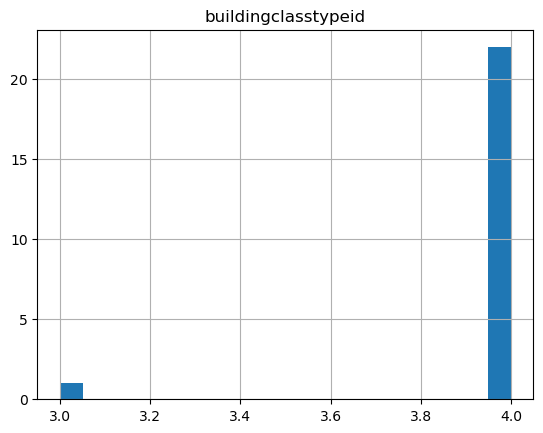

Number of unique values: 3
Unique values: [nan, 3.0, 4.0]


In [13]:
column='buildingclasstypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'buildingclasstypeid'. It is not clear what value we would impute and the overwhelming majority of values are missing.

In [14]:
ZD.drop_column(column='buildingclasstypeid', printBool=True)

train_x shape: (117521, 58)
val_x shape: (25184, 58)
test_x shape: (25183, 58)


### finishedsquarefeet13 (drop)

Column: finishedsquarefeet13
Nonzero count: 117521
Ratio of missing data: 0.9995745441240289
Type: float64


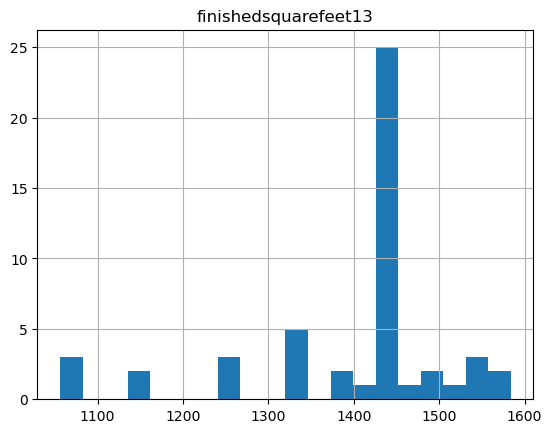

Number of unique values: 15
Unique values: [nan, 1056.0, 1060.0, 1152.0, 1248.0, 1344.0, 1392.0, 1416.0, 1440.0, 1464.0, 1488.0, 1512.0, 1536.0, 1560.0, 1584.0]


In [15]:
column='finishedsquarefeet13'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'finishedsquarefeet13'. There is no clear logical reason to impute the a specific value.

In [16]:
ZD.drop_column(column='finishedsquarefeet13', printBool=True) 

train_x shape: (117521, 57)
val_x shape: (25184, 57)
test_x shape: (25183, 57)


### basementsqft (drop)

Column: basementsqft
Nonzero count: 117521
Ratio of missing data: 0.9994383982437182
Type: float64


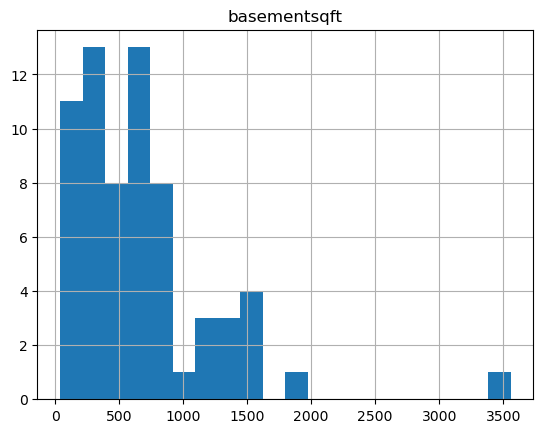

Number of unique values: 59
Unique values: [nan, 38.0, 90.0, 100.0, 168.0, 184.0, 196.0, 198.0, 200.0, 204.0, 224.0, 234.0, 238.0, 252.0, 254.0, 260.0, 273.0, 300.0, 312.0, 330.0, 380.0, 384.0, 394.0, 485.0, 493.0, 510.0, 512.0, 515.0, 557.0, 564.0, 585.0, 588.0, 608.0, 616.0, 640.0, 645.0, 669.0, 671.0, 674.0, 700.0, 786.0, 800.0, 802.0, 814.0, 819.0, 900.0, 912.0, 913.0, 1048.0, 1210.0, 1218.0, 1252.0, 1312.0, 1350.0, 1416.0, 1528.0, 1551.0, 1809.0, 3560.0]


In [17]:
column='basementsqft'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'basementsqft'. There is no clear logical reason to impute the a specific value.

In [18]:
ZD.drop_column(column='basementsqft', printBool=True)

train_x shape: (117521, 56)
val_x shape: (25184, 56)
test_x shape: (25183, 56)


### storytypeid (drop)

Column: storytypeid
Nonzero count: 117521
Ratio of missing data: 0.9994383982437182
Type: float64


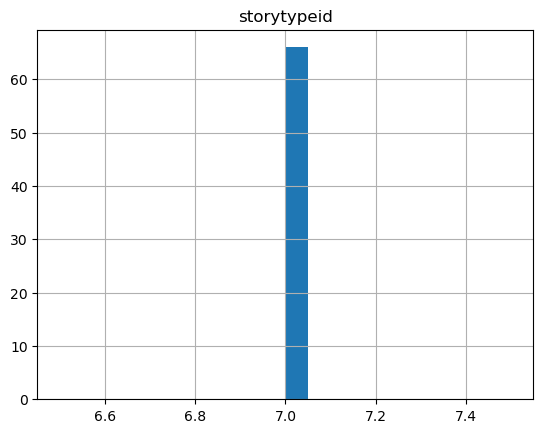

Number of unique values: 2
Unique values: [nan, 7.0]


In [19]:
column='storytypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'storytypeid'. There is no clear logical reason to impute the a specific value. It might be argued that this should be a binary column but that is not clear.

In [20]:
ZD.drop_column(column='storytypeid', printBool=True)

train_x shape: (117521, 55)
val_x shape: (25184, 55)
test_x shape: (25183, 55)


### yardbuildingsqft26 (drop)

Column: yardbuildingsqft26
Nonzero count: 117521
Ratio of missing data: 0.9989448694275916
Type: float64


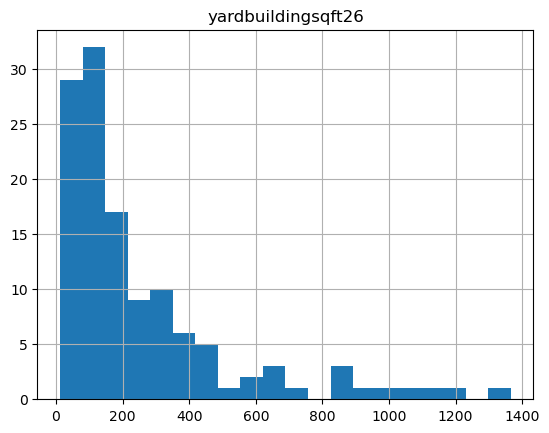

Number of unique values: 91
Unique values: [nan, 12.0, 16.0, 18.0, 28.0, 30.0, 33.0, 36.0, 37.0, 39.0, 41.0, 48.0, 49.0, 54.0, 56.0, 60.0, 62.0, 66.0, 71.0, 72.0, 78.0, 88.0, 90.0, 91.0, 100.0, 104.0, 105.0, 108.0, 110.0, 113.0, 119.0, 120.0, 125.0, 126.0, 133.0, 136.0, 144.0, 150.0, 159.0, 160.0, 168.0, 169.0, 180.0, 192.0, 195.0, 196.0, 200.0, 204.0, 218.0, 230.0, 231.0, 235.0, 240.0, 250.0, 252.0, 264.0, 276.0, 284.0, 288.0, 290.0, 292.0, 300.0, 308.0, 310.0, 314.0, 320.0, 336.0, 360.0, 368.0, 384.0, 400.0, 414.0, 448.0, 462.0, 477.0, 480.0, 550.0, 575.0, 576.0, 642.0, 648.0, 752.0, 846.0, 864.0, 868.0, 943.0, 1000.0, 1050.0, 1100.0, 1200.0, 1366.0]


In [21]:
column='yardbuildingsqft26'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'yardbuildingsqft26'. There is no clear logical reason to impute the a specific value.

In [22]:
ZD.drop_column(column='yardbuildingsqft26', printBool=True)

train_x shape: (117521, 54)
val_x shape: (25184, 54)
test_x shape: (25183, 54)


### fireplaceflag (impute)

In [23]:
column='fireplaceflag'
ZillowData.investigate_column(column='fireplaceflag', df=ZD.train_x)

Column: fireplaceflag
Nonzero count: 117521
Ratio of missing data: 0.9976770109171977
Type: object

Unable to plot histogram.

Number of unique values: 2
Unique values: [nan, True]


The column 'fireplaceflag' only has either NaN or True, suggesting that NaNs can be replaced by False. These booleans can then be converted to 0 (False) or 1 (True).

In [24]:
ZD.clean_column_impute_binary(column='fireplaceflag', fill_value=0, replace_value=True, replace_with=1, printBool=True)

train_x fireplaceflag unique values: [0, 1]


### architecturalstyletypeid (drop)

Column: architecturalstyletypeid
Nonzero count: 117521
Ratio of missing data: 0.997157954748513
Type: float64


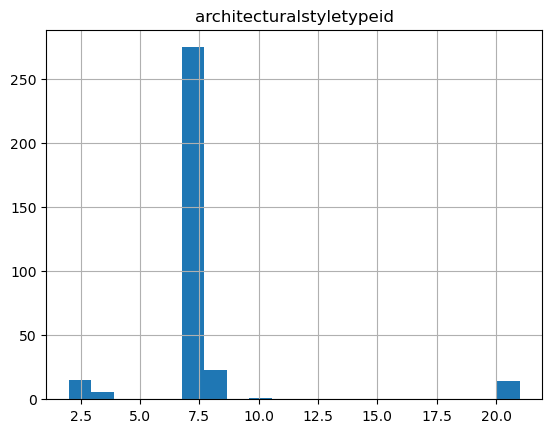

Number of unique values: 7
Unique values: [nan, 2.0, 3.0, 7.0, 8.0, 10.0, 21.0]


In [25]:
column='architecturalstyletypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'architecturalstyletypeid'.

In [26]:
ZD.drop_column(column='architecturalstyletypeid', printBool=True)

train_x shape: (117521, 53)
val_x shape: (25184, 53)
test_x shape: (25183, 53)


### typeconstructiontypeid (drop)

Column: typeconstructiontypeid
Nonzero count: 117521
Ratio of missing data: 0.996834608282775
Type: float64


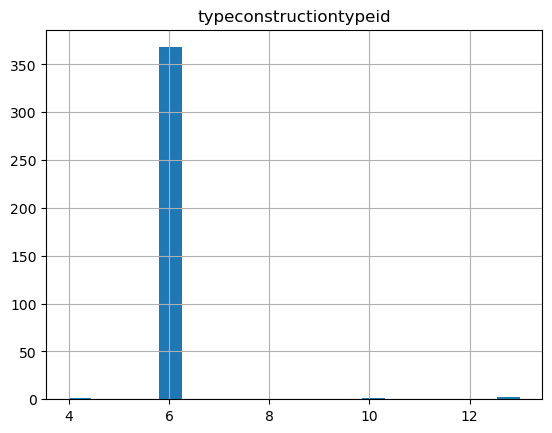

Number of unique values: 5
Unique values: [nan, 4.0, 6.0, 10.0, 13.0]


In [27]:
column='typeconstructiontypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'typeconstructiontypeid'.

In [28]:
ZD.drop_column(column='typeconstructiontypeid', printBool=True)

train_x shape: (117521, 52)
val_x shape: (25184, 52)
test_x shape: (25183, 52)


### finishedsquarefeet6 (drop)

Column: finishedsquarefeet6
Nonzero count: 117521
Ratio of missing data: 0.9953114762467985
Type: float64


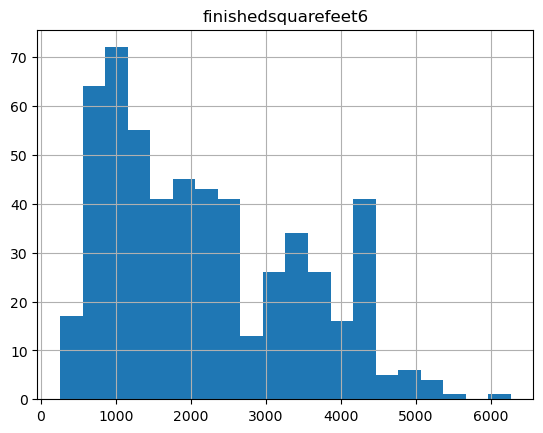

Number of unique values: 469
Unique values: [nan, 257.0, 300.0, 360.0, 384.0, 393.0, 400.0, 438.0, 460.0, 480.0, 501.0, 520.0, 529.0, 531.0, 532.0, 540.0, 572.0, 595.0, 601.0, 605.0, 624.0, 634.0, 653.0, 664.0, 666.0, 670.0, 672.0, 684.0, 688.0, 700.0, 708.0, 716.0, 720.0, 722.0, 726.0, 728.0, 732.0, 736.0, 738.0, 740.0, 750.0, 758.0, 759.0, 761.0, 765.0, 770.0, 783.0, 784.0, 786.0, 800.0, 811.0, 812.0, 816.0, 820.0, 826.0, 836.0, 837.0, 844.0, 845.0, 848.0, 852.0, 854.0, 856.0, 858.0, 864.0, 880.0, 882.0, 898.0, 899.0, 900.0, 904.0, 908.0, 909.0, 912.0, 920.0, 922.0, 924.0, 926.0, 935.0, 937.0, 938.0, 940.0, 942.0, 944.0, 952.0, 954.0, 955.0, 956.0, 960.0, 972.0, 988.0, 989.0, 991.0, 1000.0, 1006.0, 1008.0, 1009.0, 1016.0, 1029.0, 1030.0, 1036.0, 1040.0, 1044.0, 1049.0, 1056.0, 1058.0, 1064.0, 1074.0, 1078.0, 1080.0, 1082.0, 1085.0, 1092.0, 1104.0, 1106.0, 1112.0, 1115.0, 1125.0, 1130.0, 1132.0, 1136.0, 1140.0, 1151.0, 1152.0, 1154.0, 1159.0, 1163.0, 1167.0, 1172.0, 1180.0, 1200.0, 12

In [29]:
column='finishedsquarefeet6'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'finishedsquarefeet6'.

In [30]:
ZD.drop_column(column='finishedsquarefeet6', printBool=True)

train_x shape: (117521, 51)
val_x shape: (25184, 51)
test_x shape: (25183, 51)


### decktypeid (impute)

Column: decktypeid
Nonzero count: 117521
Ratio of missing data: 0.9925289948179474
Type: float64


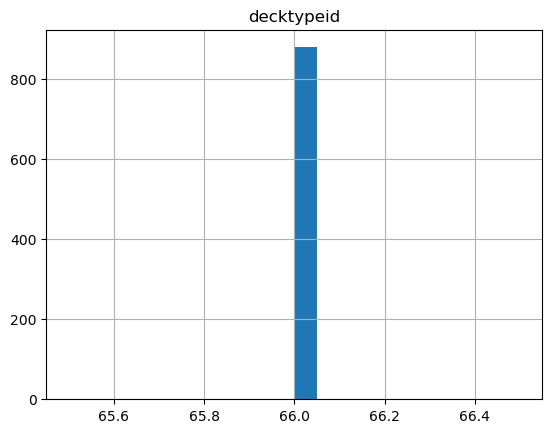

Number of unique values: 2
Unique values: [nan, 66.0]


In [31]:
column='decktypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

There is only one decktypeid present so we can convert these into 0 and 1 indicating the presence of a deck.

In [32]:
ZD.clean_column_impute_binary(column='decktypeid', fill_value=0, replace_value=66.0, replace_with=1, printBool=True)

train_x decktypeid unique values: [0.0, 1.0]


### pooltypeid10 (drop)

Column: pooltypeid10
Nonzero count: 117521
Ratio of missing data: 0.9903081151453783
Type: float64


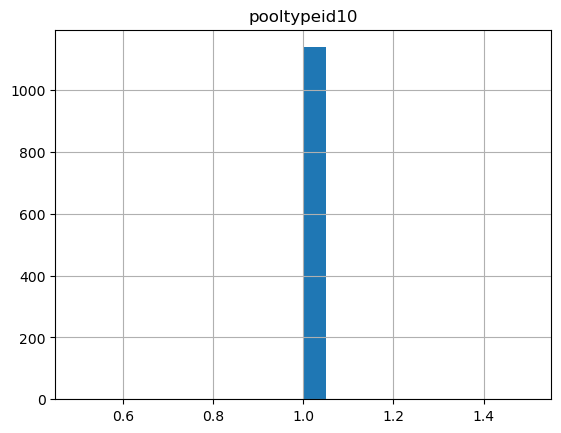

Number of unique values: 2
Unique values: [nan, 1.0]


In [33]:
column='pooltypeid10'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'pooltypeid10'.

In [34]:
ZD.drop_column(column='pooltypeid10', printBool=True) 

train_x shape: (117521, 50)
val_x shape: (25184, 50)
test_x shape: (25183, 50)


### poolsizesum (impute)

Column: poolsizesum
Nonzero count: 117521
Ratio of missing data: 0.98925298457297
Type: float64


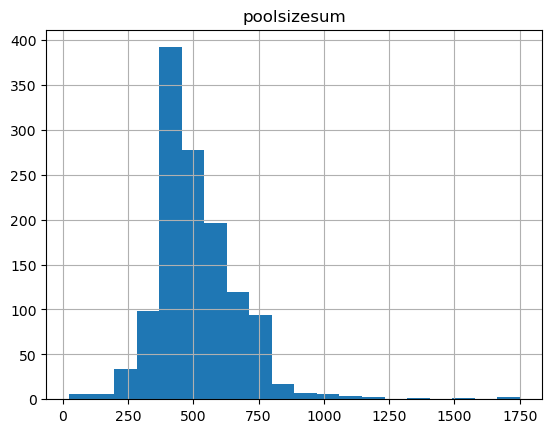

Number of unique values: 321
Unique values: [nan, 24.0, 40.0, 49.0, 65.0, 91.0, 105.0, 112.0, 129.0, 144.0, 160.0, 172.0, 200.0, 207.0, 216.0, 230.0, 238.0, 240.0, 242.0, 250.0, 255.0, 256.0, 257.0, 264.0, 265.0, 270.0, 275.0, 276.0, 277.0, 288.0, 290.0, 291.0, 294.0, 299.0, 300.0, 304.0, 306.0, 308.0, 312.0, 319.0, 320.0, 321.0, 324.0, 325.0, 327.0, 330.0, 333.0, 336.0, 338.0, 340.0, 342.0, 343.0, 345.0, 350.0, 352.0, 358.0, 360.0, 362.0, 364.0, 365.0, 366.0, 367.0, 368.0, 369.0, 370.0, 371.0, 372.0, 375.0, 377.0, 378.0, 380.0, 382.0, 384.0, 385.0, 386.0, 387.0, 389.0, 390.0, 391.0, 392.0, 394.0, 395.0, 396.0, 397.0, 398.0, 400.0, 402.0, 403.0, 404.0, 405.0, 406.0, 408.0, 410.0, 411.0, 412.0, 414.0, 415.0, 416.0, 418.0, 419.0, 420.0, 421.0, 422.0, 423.0, 425.0, 427.0, 428.0, 429.0, 430.0, 432.0, 434.0, 435.0, 439.0, 440.0, 442.0, 443.0, 444.0, 447.0, 448.0, 449.0, 450.0, 451.0, 453.0, 455.0, 456.0, 459.0, 460.0, 461.0, 462.0, 464.0, 465.0, 467.0, 468.0, 470.0, 471.0, 472.0, 474.0, 475

In [35]:
column='poolsizesum'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Missing values are likely 0 indicating that a pool wasn't present.

In [36]:
ZD.impute_column(column='poolsizesum', fill_value=0, printBool=True)

train_x poolsizesum unique values: [0.0, 24.0, 40.0, 49.0, 65.0, 91.0, 105.0, 112.0, 129.0, 144.0, 160.0, 172.0, 200.0, 207.0, 216.0, 230.0, 238.0, 240.0, 242.0, 250.0, 255.0, 256.0, 257.0, 264.0, 265.0, 270.0, 275.0, 276.0, 277.0, 288.0, 290.0, 291.0, 294.0, 299.0, 300.0, 304.0, 306.0, 308.0, 312.0, 319.0, 320.0, 321.0, 324.0, 325.0, 327.0, 330.0, 333.0, 336.0, 338.0, 340.0, 342.0, 343.0, 345.0, 350.0, 352.0, 358.0, 360.0, 362.0, 364.0, 365.0, 366.0, 367.0, 368.0, 369.0, 370.0, 371.0, 372.0, 375.0, 377.0, 378.0, 380.0, 382.0, 384.0, 385.0, 386.0, 387.0, 389.0, 390.0, 391.0, 392.0, 394.0, 395.0, 396.0, 397.0, 398.0, 400.0, 402.0, 403.0, 404.0, 405.0, 406.0, 408.0, 410.0, 411.0, 412.0, 414.0, 415.0, 416.0, 418.0, 419.0, 420.0, 421.0, 422.0, 423.0, 425.0, 427.0, 428.0, 429.0, 430.0, 432.0, 434.0, 435.0, 439.0, 440.0, 442.0, 443.0, 444.0, 447.0, 448.0, 449.0, 450.0, 451.0, 453.0, 455.0, 456.0, 459.0, 460.0, 461.0, 462.0, 464.0, 465.0, 467.0, 468.0, 470.0, 471.0, 472.0, 474.0, 475.0, 476.0

### pooltypeid2 (impute)

Column: pooltypeid2
Nonzero count: 117521
Ratio of missing data: 0.986632176376988
Type: float64


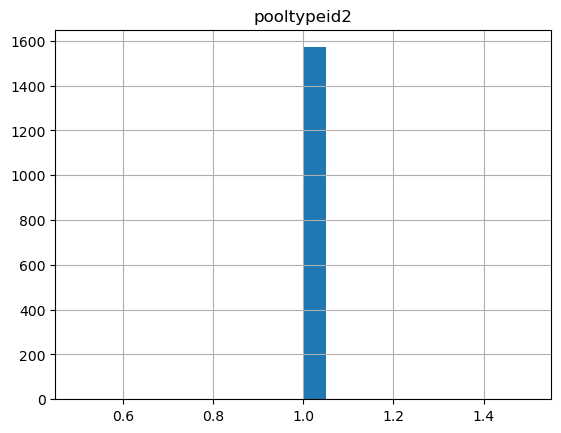

Number of unique values: 2
Unique values: [nan, 1.0]


In [37]:
column='pooltypeid2'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Lets turn pooltypeid2 into a binary case as we assume NaN values should be zeros.

In [38]:
ZD.impute_column(column='pooltypeid2', fill_value=0, printBool=True)

train_x pooltypeid2 unique values: [0.0, 1.0]


### hashottuborspa (impute)

In [39]:
column='hashottuborspa'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Column: hashottuborspa
Nonzero count: 117521
Ratio of missing data: 0.9769402915223662
Type: object

Unable to plot histogram.

Number of unique values: 2
Unique values: [nan, True]


We can make these values binary indicating the presence of a hot tub or spa.

In [40]:
ZD.clean_column_impute_binary(column='hashottuborspa', fill_value=0, replace_value=True, replace_with=1, printBool=True)

train_x hashottuborspa unique values: [0, 1]


### taxdelinquencyflag (impute)

In [41]:
column='taxdelinquencyflag'
#ZillowData.investigate_column(column=column, df=ZD.train_x)

In [42]:
print(f"Unique values: {ZD.train_x[column].unique()}")

Unique values: [nan 'Y']


We will change NaN to 0 and Y to 1.

In [43]:
ZD.clean_column_impute_binary(column='taxdelinquencyflag', fill_value=0, replace_value='Y', replace_with=1, printBool=True)

train_x taxdelinquencyflag unique values: [0, 1]


### taxdelinquencyyear (drop)

Column: taxdelinquencyyear
Nonzero count: 117521
Ratio of missing data: 0.9718518392457518
Type: float64


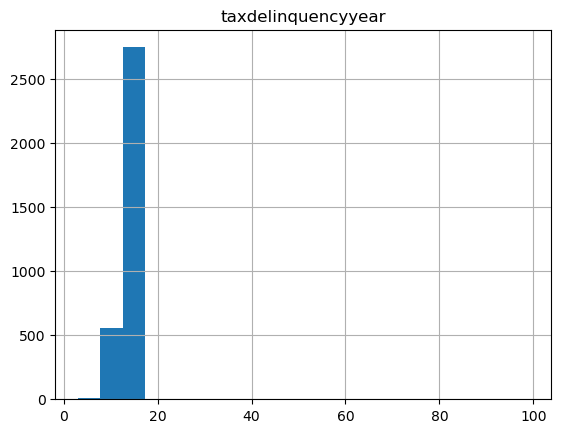

Number of unique values: 13
Unique values: [nan, 3.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 99.0]


In [44]:
column='taxdelinquencyyear'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'taxdelinquencyyear'.

In [45]:
ZD.drop_column(column='taxdelinquencyyear', printBool=True) 

train_x shape: (117521, 49)
val_x shape: (25184, 49)
test_x shape: (25183, 49)


### yardbuildingsqft17 (impute)

Column: yardbuildingsqft17
Nonzero count: 117521
Ratio of missing data: 0.9701585248593868
Type: float64


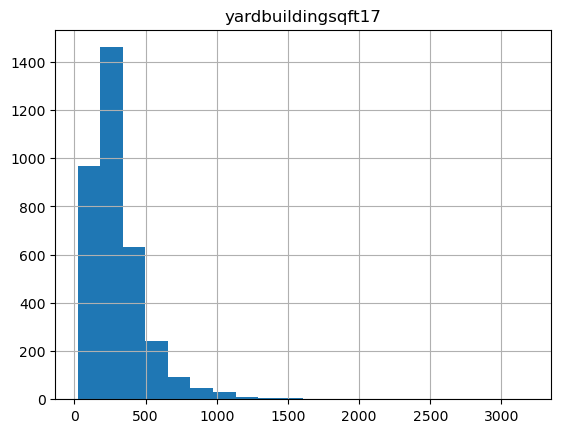

Number of unique values: 648
Unique values: [nan, 24.0, 25.0, 28.0, 30.0, 31.0, 36.0, 37.0, 40.0, 41.0, 42.0, 44.0, 45.0, 48.0, 49.0, 50.0, 54.0, 55.0, 56.0, 57.0, 60.0, 63.0, 64.0, 65.0, 66.0, 68.0, 69.0, 70.0, 72.0, 73.0, 75.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 90.0, 91.0, 92.0, 93.0, 95.0, 96.0, 97.0, 98.0, 100.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 115.0, 116.0, 117.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 140.0, 141.0, 142.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 159.0, 160.0, 161.0, 162.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0, 185.0, 186.0, 187.0, 188.0, 189.0, 190.0, 192.0, 194.0, 195.0, 196.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0,

In [46]:
column='yardbuildingsqft17'
ZillowData.investigate_column(column=column, df=ZD.train_x)

The nan values are very likely due to lacking a yard so we can replace nan with 0.

In [47]:
ZD.impute_column(column='yardbuildingsqft17', fill_value=0, printBool=True)

train_x yardbuildingsqft17 unique values: [0.0, 24.0, 25.0, 28.0, 30.0, 31.0, 36.0, 37.0, 40.0, 41.0, 42.0, 44.0, 45.0, 48.0, 49.0, 50.0, 54.0, 55.0, 56.0, 57.0, 60.0, 63.0, 64.0, 65.0, 66.0, 68.0, 69.0, 70.0, 72.0, 73.0, 75.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 90.0, 91.0, 92.0, 93.0, 95.0, 96.0, 97.0, 98.0, 100.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 115.0, 116.0, 117.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 140.0, 141.0, 142.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 159.0, 160.0, 161.0, 162.0, 164.0, 165.0, 166.0, 167.0, 168.0, 169.0, 170.0, 171.0, 172.0, 173.0, 174.0, 175.0, 176.0, 177.0, 178.0, 179.0, 180.0, 181.0, 182.0, 183.0, 184.0, 185.0, 186.0, 187.0, 188.0, 189.0, 190.0, 192.0, 194.0, 195.0, 196.0, 198.0, 199.0, 200.0, 201.0, 202.0, 203.0, 2

### finishedsquarefeet15 (drop)

Column: finishedsquarefeet15
Nonzero count: 117521
Ratio of missing data: 0.9608325320581003
Type: float64


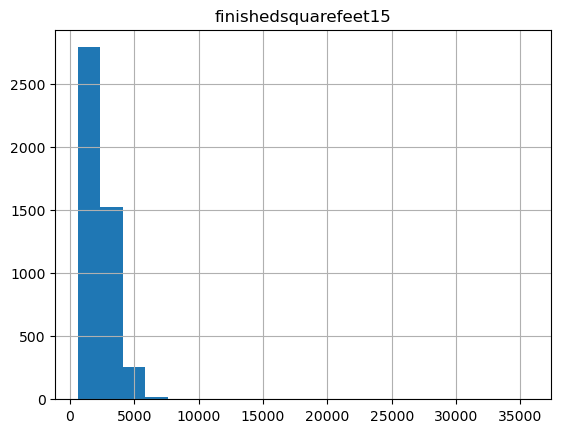

Number of unique values: 2195
Unique values: [nan, 608.0, 609.0, 628.0, 646.0, 654.0, 664.0, 700.0, 716.0, 719.0, 744.0, 759.0, 792.0, 798.0, 808.0, 826.0, 836.0, 847.0, 864.0, 873.0, 880.0, 884.0, 893.0, 894.0, 902.0, 906.0, 912.0, 924.0, 926.0, 932.0, 933.0, 936.0, 939.0, 950.0, 957.0, 960.0, 968.0, 969.0, 970.0, 972.0, 973.0, 976.0, 978.0, 980.0, 984.0, 985.0, 988.0, 990.0, 996.0, 1000.0, 1002.0, 1004.0, 1008.0, 1012.0, 1024.0, 1026.0, 1032.0, 1033.0, 1036.0, 1037.0, 1038.0, 1039.0, 1040.0, 1042.0, 1044.0, 1054.0, 1056.0, 1064.0, 1068.0, 1070.0, 1072.0, 1075.0, 1076.0, 1079.0, 1080.0, 1082.0, 1083.0, 1088.0, 1089.0, 1090.0, 1091.0, 1092.0, 1096.0, 1098.0, 1100.0, 1101.0, 1104.0, 1107.0, 1110.0, 1112.0, 1113.0, 1116.0, 1118.0, 1120.0, 1121.0, 1123.0, 1124.0, 1125.0, 1126.0, 1128.0, 1134.0, 1137.0, 1140.0, 1141.0, 1142.0, 1144.0, 1147.0, 1148.0, 1150.0, 1152.0, 1154.0, 1156.0, 1157.0, 1158.0, 1159.0, 1160.0, 1166.0, 1167.0, 1170.0, 1175.0, 1176.0, 1178.0, 1180.0, 1181.0, 1182.0, 1184.

In [48]:
column='finishedsquarefeet15'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'finishedsquarefeet15'.

In [49]:
ZD.drop_column(column='finishedsquarefeet15', printBool=True) 

train_x shape: (117521, 48)
val_x shape: (25184, 48)
test_x shape: (25183, 48)


### finishedsquarefeet50 (drop)

Column: finishedsquarefeet50
Nonzero count: 117521
Ratio of missing data: 0.9238689255537308
Type: float64


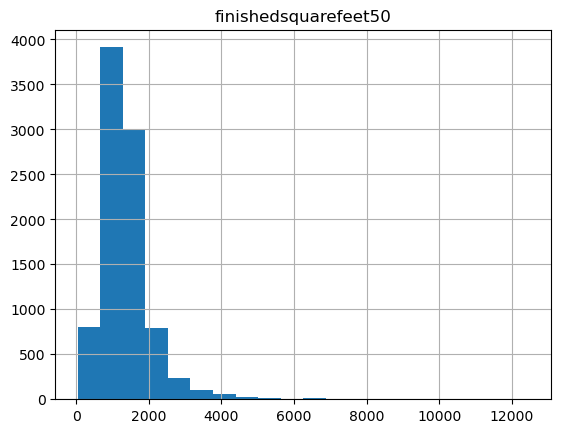

Number of unique values: 2052
Unique values: [44.0, 61.0, 64.0, 105.0, 307.0, 619.0, 620.0, 625.0, 725.0, 755.0, 803.0, 811.0, 850.0, 853.0, 868.0, 890.0, 914.0, 933.0, 942.0, 960.0, 963.0, 979.0, 999.0, 1004.0, 1015.0, 1036.0, 1065.0, 1080.0, 1096.0, 1105.0, 1113.0, 1118.0, 1129.0, 1138.0, 1140.0, 1142.0, 1151.0, 1180.0, 1185.0, 1208.0, 1210.0, 1262.0, 1289.0, 1291.0, 1293.0, nan, 49.0, 63.0, 66.0, 69.0, 79.0, 96.0, 99.0, 101.0, 106.0, 107.0, 109.0, 117.0, 124.0, 126.0, 130.0, 133.0, 136.0, 157.0, 160.0, 200.0, 235.0, 240.0, 255.0, 266.0, 268.0, 271.0, 278.0, 286.0, 288.0, 289.0, 293.0, 295.0, 300.0, 321.0, 328.0, 330.0, 334.0, 352.0, 376.0, 381.0, 386.0, 392.0, 395.0, 396.0, 398.0, 400.0, 403.0, 405.0, 408.0, 410.0, 418.0, 420.0, 425.0, 426.0, 428.0, 429.0, 430.0, 431.0, 435.0, 440.0, 441.0, 446.0, 447.0, 451.0, 454.0, 456.0, 457.0, 459.0, 460.0, 461.0, 462.0, 463.0, 465.0, 469.0, 471.0, 473.0, 476.0, 478.0, 480.0, 482.0, 483.0, 486.0, 487.0, 490.0, 493.0, 494.0, 495.0, 496.0, 499.0,

In [50]:
column='finishedsquarefeet50'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'finishedsquarefeet50'.

In [51]:
ZD.drop_column(column='finishedsquarefeet50', printBool=True) 

train_x shape: (117521, 47)
val_x shape: (25184, 47)
test_x shape: (25183, 47)


### finishedfloor1squarefeet (drop)

Column: finishedfloor1squarefeet
Nonzero count: 117521
Ratio of missing data: 0.9238689255537308
Type: float64


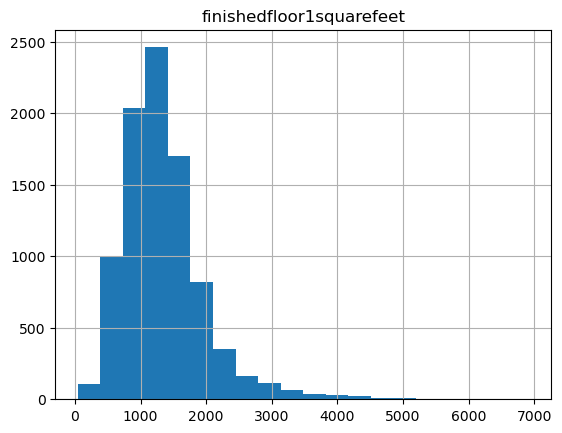

Number of unique values: 2034
Unique values: [44.0, 61.0, 64.0, 69.0, 79.0, 96.0, 99.0, 105.0, 109.0, 120.0, 235.0, 271.0, 288.0, 330.0, 352.0, 386.0, 400.0, 410.0, 420.0, 430.0, 441.0, 457.0, 459.0, 460.0, 461.0, 462.0, 465.0, 469.0, 482.0, 490.0, 501.0, 508.0, 513.0, 520.0, 522.0, 528.0, 534.0, 540.0, 546.0, 551.0, 564.0, 573.0, 579.0, 585.0, 589.0, 591.0, 596.0, 597.0, 598.0, 600.0, 605.0, 611.0, 612.0, 615.0, 616.0, 617.0, 620.0, 624.0, 625.0, 626.0, 627.0, 630.0, 637.0, 638.0, 647.0, 655.0, 656.0, 669.0, 672.0, 681.0, 688.0, 689.0, 690.0, 693.0, 697.0, 699.0, 703.0, 704.0, 706.0, 707.0, 714.0, 716.0, 720.0, 725.0, 729.0, 733.0, 734.0, 742.0, 746.0, 750.0, 753.0, 754.0, 755.0, 756.0, 757.0, 758.0, 760.0, 761.0, 774.0, 780.0, 782.0, 787.0, 789.0, 790.0, 791.0, 792.0, 800.0, 801.0, 802.0, 803.0, 806.0, 810.0, 811.0, 816.0, 817.0, 818.0, 830.0, 832.0, 834.0, 835.0, 837.0, 840.0, 843.0, 844.0, 846.0, 850.0, 851.0, 853.0, 855.0, 863.0, 868.0, 870.0, 873.0, 875.0, 876.0, 880.0, 882.0, 88

In [52]:
column='finishedfloor1squarefeet'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'finishedfloor1squarefeet'.

In [53]:
ZD.drop_column(column='finishedfloor1squarefeet', printBool=True) 

train_x shape: (117521, 46)
val_x shape: (25184, 46)
test_x shape: (25183, 46)


Now we will address the next twenty columns.

In [54]:
train_na_ratio_df.iloc[20:40,:]

,NAN_ratio
fireplacecnt,0.894308
threequarterbathnbr,0.868270
pooltypeid7,0.809643
poolcnt,0.796147
numberofstories,0.773555
airconditioningtypeid,0.678628
garagecarcnt,0.670765
garagetotalsqft,0.670765
regionidneighborhood,0.601875
heatingorsystemtypeid,0.369645


### fireplacecnt (impute)

Column: fireplacecnt
Nonzero count: 117521
Ratio of missing data: 0.8943082512912586
Type: float64


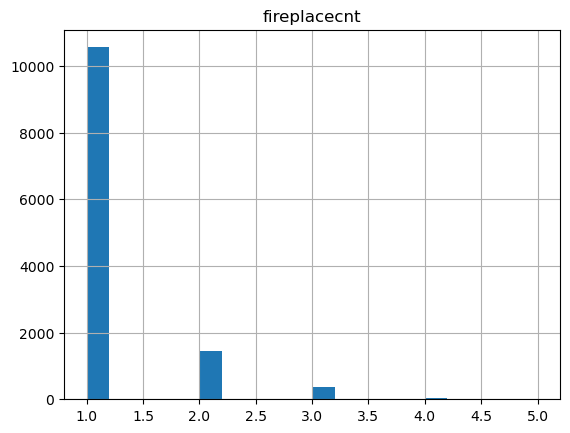

Number of unique values: 6
Unique values: [1.0, nan, 2.0, 3.0, 4.0, 5.0]


In [55]:
column='fireplacecnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

The missing values can reasonably be replaced with 0's to indicate no fire place present.

In [56]:
ZD.impute_column(column='fireplacecnt', fill_value=0, printBool=True) 

train_x fireplacecnt unique values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0]


### threequarterbathnbr (drop)

Column: threequarterbathnbr
Nonzero count: 117521
Ratio of missing data: 0.8682703516818271
Type: float64


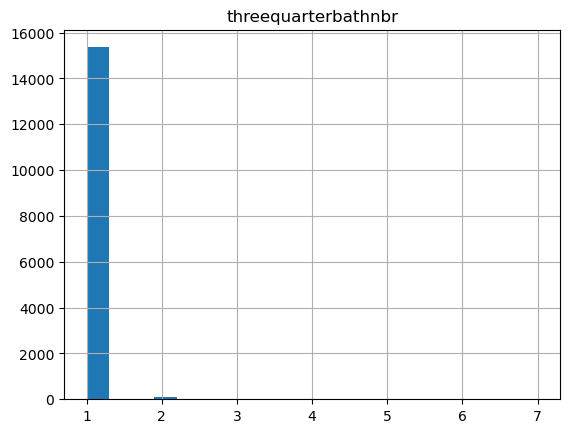

Number of unique values: 6
Unique values: [1.0, nan, 2.0, 3.0, 4.0, 7.0]


In [57]:
column='threequarterbathnbr'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Drop 'threequarterbathnbr' since we already have bathroom count.

In [58]:
ZD.drop_column(column='threequarterbathnbr', printBool=True) 

train_x shape: (117521, 45)
val_x shape: (25184, 45)
test_x shape: (25183, 45)


### pooltypeid7 (impute)

Column: pooltypeid7
Nonzero count: 117521
Ratio of missing data: 0.8096425319730091
Type: float64


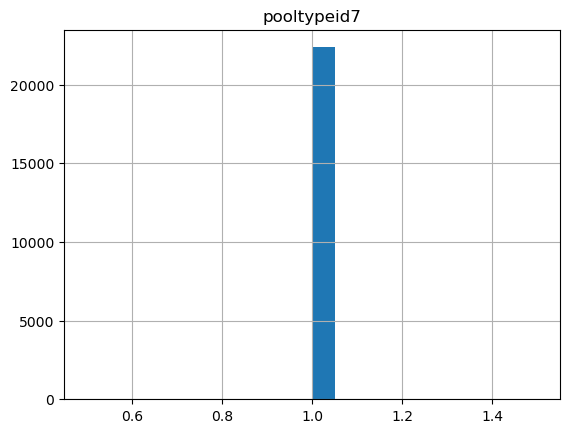

Number of unique values: 2
Unique values: [nan, 1.0]


In [59]:
column='pooltypeid7'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Missing values are reasonably 0 indicating pool without hot tub.

In [60]:
ZD.impute_column(column='pooltypeid7', fill_value=0, printBool=True) 

train_x pooltypeid7 unique values: [0.0, 1.0]


### poolcnt (impute)

Column: poolcnt
Nonzero count: 117521
Ratio of missing data: 0.7961470715872057
Type: float64


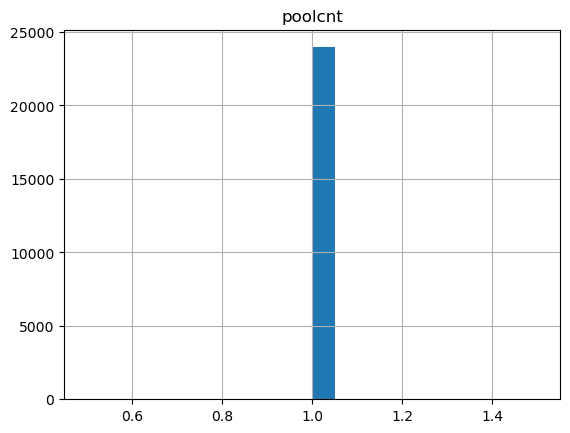

Number of unique values: 2
Unique values: [nan, 1.0]


In [61]:
column='poolcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Missing values are reasonably 0 for no pool.

In [62]:
ZD.impute_column(column='poolcnt', fill_value=0, printBool=True) 

train_x poolcnt unique values: [0.0, 1.0]


### numberofstories (drop)

Column: numberofstories
Nonzero count: 117521
Ratio of missing data: 0.7735553645731401
Type: float64


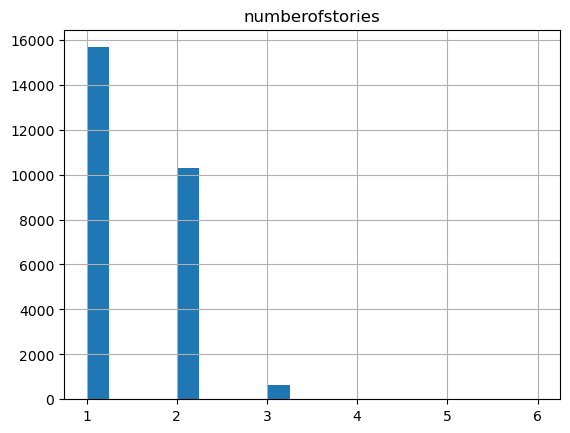

Number of unique values: 6
Unique values: [1.0, nan, 2.0, 3.0, 4.0, 6.0]


In [63]:
column='numberofstories'
ZillowData.investigate_column(column=column, df=ZD.train_x)

drop 'numberofstories' as it does not make sense to have zero stories.

In [64]:
ZD.drop_column(column='numberofstories', printBool=True) 

train_x shape: (117521, 44)
val_x shape: (25184, 44)
test_x shape: (25183, 44)


### airconditioningtypeid (impute)

Column: airconditioningtypeid
Nonzero count: 117521
Ratio of missing data: 0.6786276495264676
Type: float64


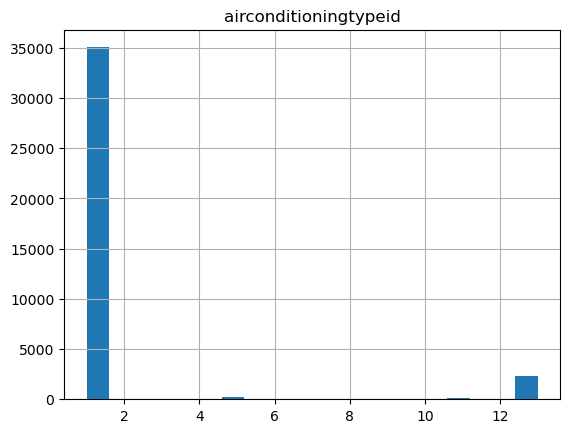

Number of unique values: 7
Unique values: [nan, 1.0, 3.0, 5.0, 9.0, 11.0, 13.0]


In [65]:
column='airconditioningtypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Impute with the dominant value which indicates air conditioning.

In [66]:
ZD.impute_column(column='airconditioningtypeid', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x airconditioningtypeid unique values: [1.0, 3.0, 5.0, 9.0, 11.0, 13.0]


### garagetotalsqft	(impute)

Column: garagetotalsqft
Nonzero count: 105672
Ratio of missing data: 0.6707652249385216
Type: float64


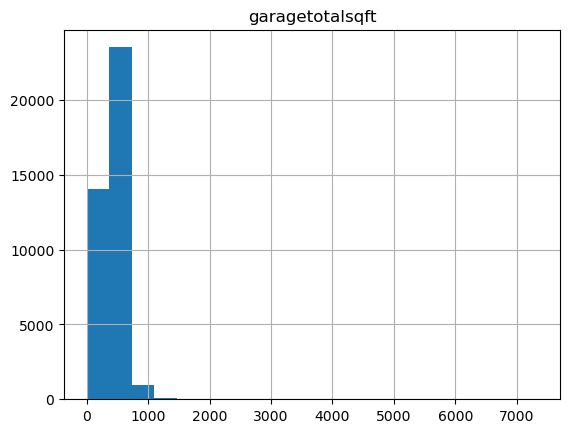

Number of unique values: 941
Unique values: [144.0, 160.0, 180.0, 198.0, 235.0, 240.0, 280.0, 324.0, 342.0, 393.0, 396.0, 399.0, 400.0, nan, 0.0, 150.0, 152.0, 158.0, 162.0, 168.0, 171.0, 175.0, 176.0, 189.0, 190.0, 192.0, 194.0, 195.0, 196.0, 200.0, 204.0, 205.0, 207.0, 209.0, 210.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 218.0, 219.0, 220.0, 221.0, 222.0, 224.0, 225.0, 228.0, 229.0, 230.0, 231.0, 232.0, 234.0, 236.0, 237.0, 238.0, 239.0, 241.0, 242.0, 244.0, 245.0, 246.0, 247.0, 248.0, 249.0, 250.0, 252.0, 253.0, 255.0, 256.0, 258.0, 259.0, 260.0, 261.0, 262.0, 263.0, 264.0, 266.0, 267.0, 269.0, 270.0, 272.0, 273.0, 274.0, 275.0, 276.0, 281.0, 283.0, 285.0, 286.0, 287.0, 288.0, 289.0, 290.0, 292.0, 294.0, 295.0, 296.0, 297.0, 298.0, 299.0, 300.0, 301.0, 304.0, 305.0, 306.0, 307.0, 308.0, 310.0, 311.0, 312.0, 315.0, 320.0, 322.0, 323.0, 325.0, 327.0, 329.0, 330.0, 331.0, 332.0, 333.0, 334.0, 335.0, 336.0, 338.0, 339.0, 340.0, 341.0, 345.0, 347.0, 348.0, 350.0, 351.0, 352.0, 354.0, 

In [67]:
column='garagetotalsqft'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Missing values are likely 0 for no garage present.

In [68]:
ZD.impute_column(column='garagetotalsqft', fill_value=0, printBool=True) 

train_x garagetotalsqft unique values: [0.0, 144.0, 150.0, 152.0, 158.0, 160.0, 162.0, 168.0, 171.0, 175.0, 176.0, 180.0, 189.0, 190.0, 192.0, 194.0, 195.0, 196.0, 198.0, 200.0, 204.0, 205.0, 207.0, 209.0, 210.0, 211.0, 212.0, 213.0, 214.0, 215.0, 216.0, 218.0, 219.0, 220.0, 221.0, 222.0, 224.0, 225.0, 228.0, 229.0, 230.0, 231.0, 232.0, 234.0, 235.0, 236.0, 237.0, 238.0, 239.0, 240.0, 241.0, 242.0, 244.0, 245.0, 246.0, 247.0, 248.0, 249.0, 250.0, 252.0, 253.0, 255.0, 256.0, 258.0, 259.0, 260.0, 261.0, 262.0, 263.0, 264.0, 266.0, 267.0, 269.0, 270.0, 272.0, 273.0, 274.0, 275.0, 276.0, 280.0, 281.0, 283.0, 285.0, 286.0, 287.0, 288.0, 289.0, 290.0, 292.0, 294.0, 295.0, 296.0, 297.0, 298.0, 299.0, 300.0, 301.0, 304.0, 305.0, 306.0, 307.0, 308.0, 310.0, 311.0, 312.0, 315.0, 320.0, 322.0, 323.0, 324.0, 325.0, 327.0, 329.0, 330.0, 331.0, 332.0, 333.0, 334.0, 335.0, 336.0, 338.0, 339.0, 340.0, 341.0, 342.0, 345.0, 347.0, 348.0, 350.0, 351.0, 352.0, 354.0, 355.0, 356.0, 357.0, 358.0, 359.0, 360

### garagecarcnt (impute)

Column: garagecarcnt
Nonzero count: 117148
Ratio of missing data: 0.6707652249385216
Type: float64


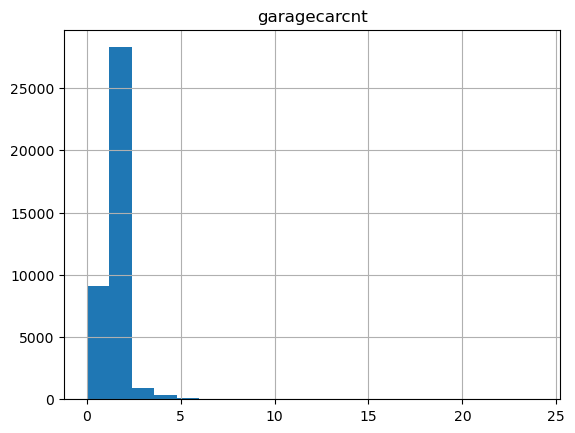

Number of unique values: 16
Unique values: [2.0, nan, 0.0, 1.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 13.0, 14.0, 24.0]


In [69]:
column='garagecarcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

In [70]:
print(f'There are {(ZD.train_x[column] == 0.0).sum()} rows with 0.')

There are 373 rows with 0.


Since so few rows have 0, it is likely that nan values are 0 for no garage present.

In [71]:
ZD.impute_column(column='garagecarcnt', fill_value=0, printBool=True) 

train_x garagecarcnt unique values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 13.0, 14.0, 24.0]


### regionidneighborhood (drop)

Column: regionidneighborhood
Nonzero count: 117521
Ratio of missing data: 0.6018754095012806
Type: float64


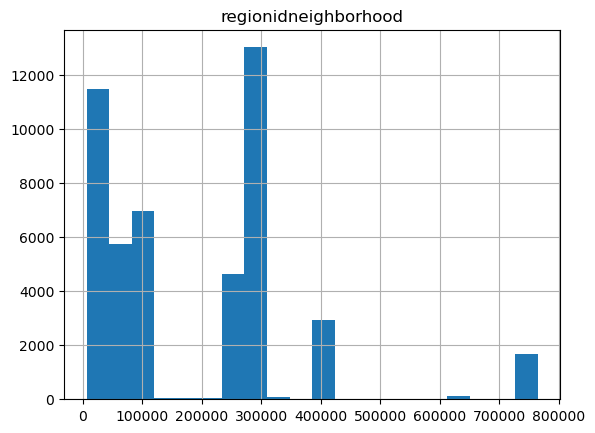

Number of unique values: 499
Unique values: [nan, 6952.0, 7877.0, 11950.0, 13017.0, 13176.0, 13327.0, 19265.0, 19810.0, 21056.0, 22655.0, 25449.0, 26134.0, 27080.0, 27328.0, 27431.0, 27484.0, 27987.0, 28119.0, 30685.0, 30731.0, 31817.0, 32059.0, 32368.0, 33183.0, 33952.0, 34213.0, 36630.0, 37739.0, 37835.0, 38888.0, 40215.0, 40548.0, 41131.0, 41466.0, 46736.0, 46795.0, 47880.0, 47950.0, 48200.0, 48516.0, 48570.0, 51224.0, 51906.0, 54300.0, 113455.0, 113688.0, 113713.0, 113749.0, 113886.0, 113910.0, 114246.0, 114808.0, 114909.0, 114914.0, 115609.0, 115656.0, 115657.0, 115729.0, 115836.0, 116206.0, 116302.0, 116375.0, 116415.0, 116430.0, 116646.0, 116692.0, 116774.0, 116828.0, 117023.0, 117148.0, 117183.0, 117954.0, 118106.0, 118208.0, 118825.0, 118849.0, 118872.0, 118887.0, 118920.0, 135143.0, 155228.0, 156012.0, 191484.0, 214079.0, 220669.0, 224568.0, 246825.0, 248165.0, 249692.0, 259315.0, 259606.0, 259818.0, 260611.0, 262098.0, 265889.0, 266606.0, 267436.0, 267814.0, 268002.0, 268007

In [72]:
column='regionidneighborhood'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will drop 'regionidneighborhood' as it is not clear what value would make sense to impute and there are many unique values.

In [73]:
ZD.drop_column(column='regionidneighborhood', printBool=True) 

train_x shape: (117521, 43)
val_x shape: (25184, 43)
test_x shape: (25183, 43)


### heatingorsystemtypeid (impute)

Column: heatingorsystemtypeid
Nonzero count: 117521
Ratio of missing data: 0.36964457416121377
Type: float64


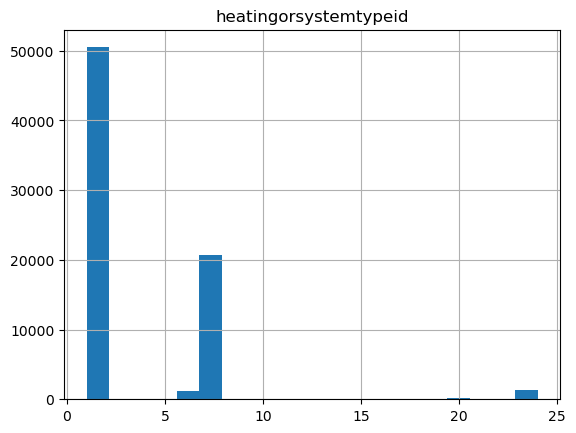

Number of unique values: 13
Unique values: [nan, 1.0, 2.0, 6.0, 7.0, 10.0, 11.0, 12.0, 13.0, 14.0, 18.0, 20.0, 24.0]


In [74]:
column='heatingorsystemtypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

Impute the majority value which indicates at least one heating system.

In [75]:
ZD.impute_column(column='heatingorsystemtypeid', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x heatingorsystemtypeid unique values: [1.0, 2.0, 6.0, 7.0, 10.0, 11.0, 12.0, 13.0, 14.0, 18.0, 20.0, 24.0]


### buildingqualitytypeid (impute)

Column: buildingqualitytypeid
Nonzero count: 117521
Ratio of missing data: 0.3609312378213255
Type: float64


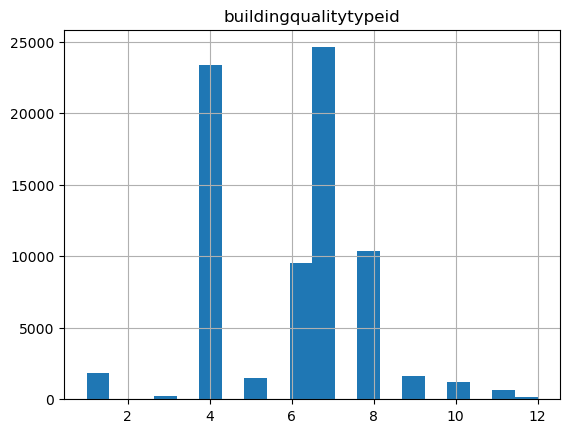

Number of unique values: 13
Unique values: [nan, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0]


In [76]:
column='buildingqualitytypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

For 'buildingqualitytypeid' we will impute with the median value.

In [77]:
ZD.impute_column(column='buildingqualitytypeid', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x buildingqualitytypeid unique values: [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0]


### propertyzoningdesc (drop)

In [78]:
column='propertyzoningdesc'
#ZillowData.investigate_column(column=column, df=ZD.train_x)
print(f"Unique values: {ZD.train_x[column].unique()}")

Unique values: [nan 'HAR3YY' 'LAC4' ... 'CLSP2*' 'CVCPPCD*' 'LRMDR 2*']


We will drop 'propertyzoningdesc' as there is similar information not in strings like this one.

In [79]:
ZD.drop_column(column='propertyzoningdesc', printBool=True) 

train_x shape: (117521, 42)
val_x shape: (25184, 42)
test_x shape: (25183, 42)


### unitcnt	(impute)

Column: unitcnt
Nonzero count: 117521
Ratio of missing data: 0.3494098927000281
Type: float64


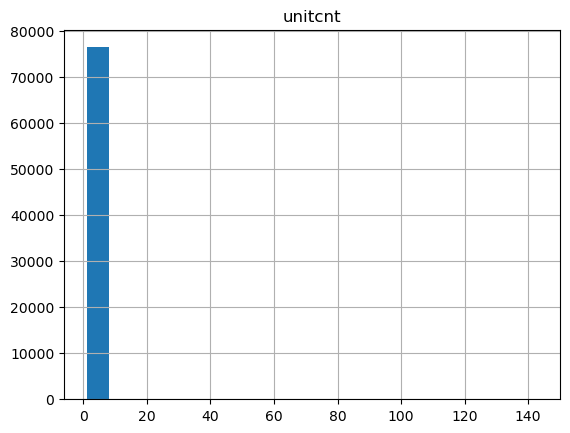

Number of unique values: 11
Unique values: [nan, 1.0, 2.0, 3.0, 4.0, 6.0, 11.0, 42.0, 45.0, 70.0, 143.0]


In [80]:
column='unitcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the dominant value for 'unitcnt' as almost all listings are 1 unit.

In [81]:
ZD.impute_column(column='unitcnt', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x unitcnt unique values: [1.0, 2.0, 3.0, 4.0, 6.0, 11.0, 42.0, 45.0, 70.0, 143.0]


### lotsizesquarefeet (impute)

Column: lotsizesquarefeet
Nonzero count: 117521
Ratio of missing data: 0.11003139864364667
Type: float64


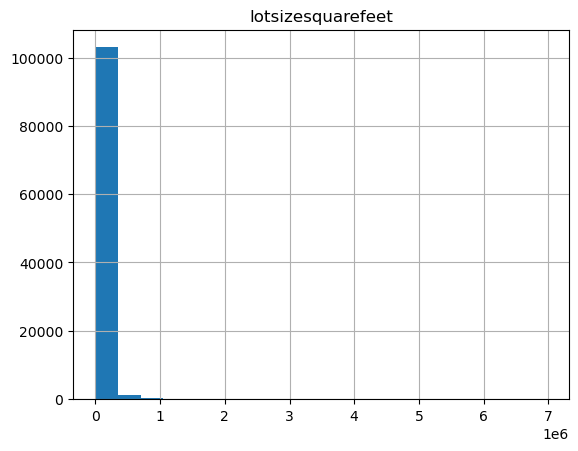

Number of unique values: 22270
Unique values: [435.0, 480.0, 540.0, 640.0, 646.0, 700.0, 704.0, 715.0, 736.0, 739.0, 740.0, 770.0, 775.0, 780.0, 784.0, 800.0, 806.0, 807.0, 808.0, 813.0, 814.0, 828.0, 846.0, 851.0, 853.0, 858.0, 860.0, 864.0, 865.0, 869.0, 871.0, 873.0, 879.0, 880.0, 883.0, 886.0, 887.0, 892.0, 898.0, 900.0, 909.0, 927.0, 931.0, 932.0, 935.0, 942.0, 951.0, 956.0, 969.0, 977.0, 981.0, 984.0, 989.0, 992.0, 999.0, 1000.0, 1003.0, 1025.0, 1032.0, 1052.0, 1053.0, 1058.0, 1063.0, 1069.0, 1071.0, 1077.0, 1078.0, 1085.0, 1091.0, 1092.0, 1114.0, 1116.0, 1120.0, 1125.0, 1130.0, 1134.0, 1139.0, 1140.0, 1150.0, 1151.0, 1152.0, 1154.0, 1161.0, 1168.0, 1188.0, 1195.0, 1196.0, 1199.0, 1201.0, 1210.0, 1215.0, 1222.0, 1223.0, 1229.0, 1237.0, 1242.0, 1246.0, 1247.0, 1253.0, 1254.0, 1256.0, 1258.0, 1266.0, 1274.0, 1275.0, 1279.0, 1280.0, 1281.0, 1290.0, 1292.0, 1294.0, 1300.0, 1306.0, 1308.0, 1313.0, 1319.0, 1320.0, 1326.0, 1334.0, 1337.0, 1339.0, 1343.0, 1344.0, 1346.0, 1350.0, 1351.0, 

In [82]:
column='lotsizesquarefeet'
ZillowData.investigate_column(column=column, df=ZD.train_x)

The scaling of this histogram isn't great but we can impute the median value.

In [83]:
ZD.impute_column(column='lotsizesquarefeet', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x lotsizesquarefeet unique values: [435.0, 480.0, 486.0, 488.0, 540.0, 592.0, 630.0, 640.0, 644.0, 646.0, 652.0, 653.0, 660.0, 700.0, 704.0, 715.0, 730.0, 736.0, 739.0, 740.0, 745.0, 754.0, 759.0, 764.0, 770.0, 775.0, 780.0, 784.0, 796.0, 800.0, 804.0, 806.0, 807.0, 808.0, 813.0, 814.0, 817.0, 822.0, 828.0, 834.0, 839.0, 846.0, 851.0, 853.0, 858.0, 860.0, 864.0, 865.0, 868.0, 869.0, 870.0, 871.0, 872.0, 873.0, 875.0, 876.0, 877.0, 878.0, 879.0, 880.0, 883.0, 885.0, 886.0, 887.0, 888.0, 892.0, 895.0, 897.0, 898.0, 899.0, 900.0, 902.0, 903.0, 905.0, 908.0, 909.0, 911.0, 912.0, 913.0, 914.0, 915.0, 917.0, 919.0, 922.0, 924.0, 925.0, 927.0, 928.0, 930.0, 931.0, 932.0, 935.0, 936.0, 942.0, 946.0, 947.0, 948.0, 950.0, 951.0, 953.0, 954.0, 955.0, 956.0, 958.0, 959.0, 960.0, 966.0, 967.0, 968.0, 969.0, 975.0, 976.0, 977.0, 978.0, 981.0, 984.0, 989.0, 990.0, 992.0, 994.0, 999.0, 1000.0, 1003.0, 1010.0, 1012.0, 1014.0, 1015.0, 1018.0, 1019.0, 1021.0, 1023.0, 1025.0, 1027.0, 1032.0, 1038.0,

### finishedsquarefeet12 (impute)

Column: finishedsquarefeet12
Nonzero count: 117521
Ratio of missing data: 0.049667718960866566
Type: float64


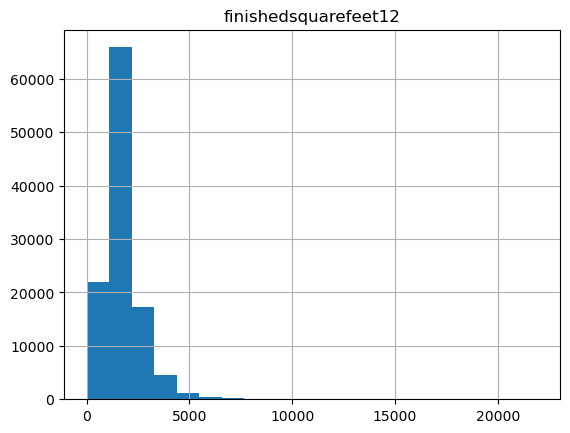

Number of unique values: 5279
Unique values: [2.0, 120.0, 603.0, 625.0, 675.0, 676.0, 682.0, 689.0, 700.0, 718.0, 720.0, 729.0, 735.0, 738.0, 762.0, 770.0, 794.0, 796.0, 800.0, 802.0, 804.0, 806.0, 818.0, 821.0, 832.0, 837.0, 841.0, 847.0, 848.0, 849.0, 864.0, 866.0, 868.0, 870.0, 872.0, 876.0, 879.0, 889.0, 896.0, 897.0, 898.0, 899.0, 900.0, 905.0, 910.0, 912.0, 913.0, 916.0, 926.0, 928.0, 936.0, 941.0, 942.0, 943.0, 968.0, 974.0, 978.0, 979.0, 982.0, 985.0, 986.0, 987.0, 989.0, 990.0, 993.0, 998.0, 999.0, 1007.0, 1008.0, 1017.0, 1021.0, 1024.0, 1030.0, 1036.0, 1038.0, 1042.0, 1043.0, 1044.0, 1048.0, 1050.0, 1057.0, 1058.0, 1065.0, 1066.0, 1072.0, 1075.0, 1082.0, 1084.0, 1089.0, 1090.0, 1092.0, 1093.0, 1094.0, 1097.0, 1111.0, 1112.0, 1113.0, 1120.0, 1121.0, 1125.0, 1128.0, 1130.0, 1135.0, 1139.0, 1141.0, 1145.0, 1152.0, 1154.0, 1155.0, 1156.0, 1161.0, 1162.0, 1163.0, 1165.0, 1173.0, 1175.0, 1178.0, 1183.0, 1184.0, 1188.0, 1189.0, 1190.0, 1195.0, 1196.0, 1201.0, 1205.0, 1206.0, 1207.0,

In [84]:
column='finishedsquarefeet12'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We can impute the median value for 'finishedsquarefeet12'.

In [85]:
ZD.impute_column(column='finishedsquarefeet12', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x finishedsquarefeet12 unique values: [2.0, 40.0, 66.0, 120.0, 128.0, 152.0, 160.0, 214.0, 230.0, 240.0, 242.0, 270.0, 280.0, 288.0, 300.0, 304.0, 310.0, 316.0, 319.0, 320.0, 326.0, 332.0, 342.0, 343.0, 352.0, 358.0, 360.0, 362.0, 363.0, 368.0, 369.0, 370.0, 371.0, 372.0, 377.0, 378.0, 380.0, 381.0, 382.0, 384.0, 385.0, 388.0, 389.0, 396.0, 397.0, 398.0, 400.0, 403.0, 404.0, 405.0, 407.0, 408.0, 410.0, 412.0, 415.0, 417.0, 418.0, 419.0, 420.0, 426.0, 427.0, 428.0, 431.0, 432.0, 433.0, 436.0, 438.0, 439.0, 440.0, 441.0, 442.0, 444.0, 445.0, 448.0, 449.0, 454.0, 455.0, 456.0, 457.0, 458.0, 462.0, 464.0, 465.0, 466.0, 468.0, 470.0, 471.0, 472.0, 473.0, 474.0, 475.0, 476.0, 477.0, 478.0, 480.0, 481.0, 482.0, 483.0, 484.0, 486.0, 487.0, 488.0, 490.0, 492.0, 494.0, 495.0, 496.0, 497.0, 498.0, 499.0, 500.0, 501.0, 502.0, 504.0, 505.0, 506.0, 508.0, 509.0, 510.0, 511.0, 512.0, 513.0, 514.0, 515.0, 516.0, 518.0, 519.0, 520.0, 521.0, 522.0, 523.0, 524.0, 525.0, 526.0, 528.0, 529.0, 530.0, 

### regionidcity (impute)

Column: regionidcity
Nonzero count: 117521
Ratio of missing data: 0.02002195352320011
Type: float64


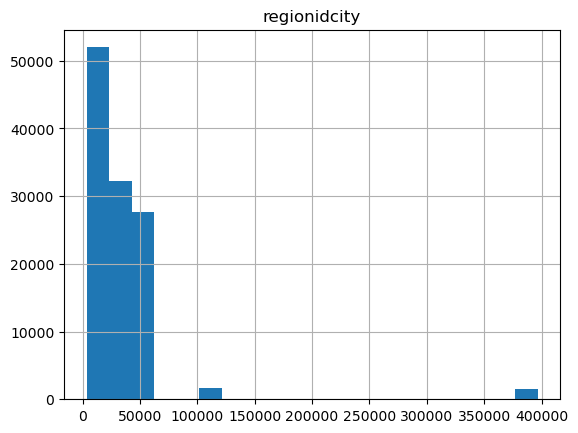

Number of unique values: 177
Unique values: [3491.0, 4406.0, 12292.0, 12447.0, 12773.0, 13091.0, 13150.0, 13693.0, 14634.0, 15554.0, 16764.0, 19177.0, 20008.0, 21412.0, 24812.0, 24832.0, 25218.0, 25459.0, 26531.0, 32380.0, 32923.0, 33837.0, 34278.0, 37015.0, 37086.0, 39076.0, 40009.0, 40227.0, 41673.0, 42150.0, 44116.0, 45457.0, 45602.0, 46298.0, 47019.0, 47568.0, 48424.0, 52835.0, 53571.0, 54212.0, 54311.0, 54352.0, 55753.0, 113412.0, 396054.0, nan, 5465.0, 5534.0, 6021.0, 6395.0, 6822.0, 8384.0, 9840.0, 10241.0, 10389.0, 10608.0, 10723.0, 10734.0, 10774.0, 10815.0, 11626.0, 12520.0, 13232.0, 13311.0, 13716.0, 14111.0, 14542.0, 14906.0, 15237.0, 16389.0, 16677.0, 16961.0, 17150.0, 17597.0, 17686.0, 17882.0, 18098.0, 18874.0, 18875.0, 21395.0, 21778.0, 22827.0, 24174.0, 24245.0, 24384.0, 24435.0, 24797.0, 25271.0, 25458.0, 25468.0, 25621.0, 25953.0, 25974.0, 26483.0, 26964.0, 26965.0, 27103.0, 27110.0, 27183.0, 27491.0, 29189.0, 29712.0, 30187.0, 30267.0, 30399.0, 30908.0, 31134.0, 326

In [86]:
column='regionidcity'
ZillowData.investigate_column(column=column, df=ZD.train_x)

For 'regionidcity' we can impute the mode.

In [87]:
ZD.impute_column(column='regionidcity', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x regionidcity unique values: [3491.0, 4406.0, 5465.0, 5534.0, 6021.0, 6395.0, 6822.0, 8384.0, 9840.0, 10241.0, 10389.0, 10608.0, 10723.0, 10734.0, 10774.0, 10815.0, 11626.0, 12292.0, 12447.0, 12520.0, 12773.0, 13091.0, 13150.0, 13232.0, 13311.0, 13693.0, 13716.0, 14111.0, 14542.0, 14634.0, 14906.0, 15237.0, 15554.0, 16389.0, 16677.0, 16764.0, 16961.0, 17150.0, 17597.0, 17686.0, 17882.0, 18098.0, 18874.0, 18875.0, 19177.0, 20008.0, 21395.0, 21412.0, 21778.0, 22827.0, 24174.0, 24245.0, 24384.0, 24435.0, 24797.0, 24812.0, 24832.0, 25218.0, 25271.0, 25458.0, 25459.0, 25468.0, 25621.0, 25953.0, 25974.0, 26483.0, 26531.0, 26964.0, 26965.0, 27103.0, 27110.0, 27183.0, 27491.0, 29189.0, 29712.0, 30187.0, 30267.0, 30399.0, 30908.0, 31134.0, 32380.0, 32616.0, 32753.0, 32923.0, 32927.0, 33252.0, 33311.0, 33312.0, 33612.0, 33727.0, 33836.0, 33837.0, 33840.0, 34037.0, 34278.0, 34543.0, 34636.0, 34780.0, 36502.0, 37015.0, 37086.0, 37688.0, 37882.0, 38032.0, 38980.0, 39076.0, 39306.0, 39308.0, 

### calculatedbathnbr (drop)

Column: calculatedbathnbr
Nonzero count: 117521
Ratio of missing data: 0.010934216012457348
Type: float64


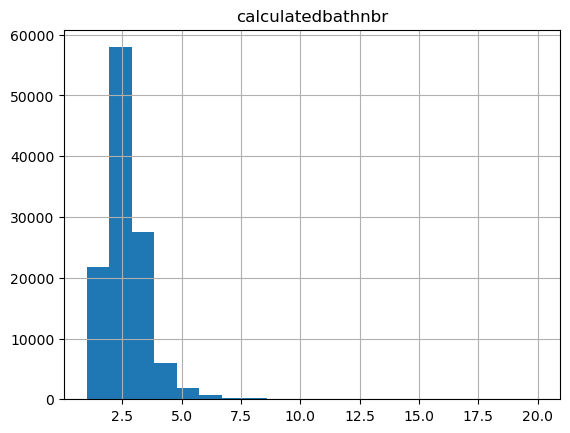

Number of unique values: 23
Unique values: [1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 8.5, 9.0, nan, 7.5, 8.0, 10.0, 11.0, 12.0, 15.0, 20.0]


In [88]:
column='calculatedbathnbr'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We can drop 'calculatedbathnbr' since there is 'bathroomcnt' with less missing values. 

In [89]:
ZD.drop_column(column='calculatedbathnbr', printBool=True) 

train_x shape: (117521, 41)
val_x shape: (25184, 41)
test_x shape: (25183, 41)


### fullbathcnt	(impute)

Column: fullbathcnt
Nonzero count: 117521
Ratio of missing data: 0.010934216012457348
Type: float64


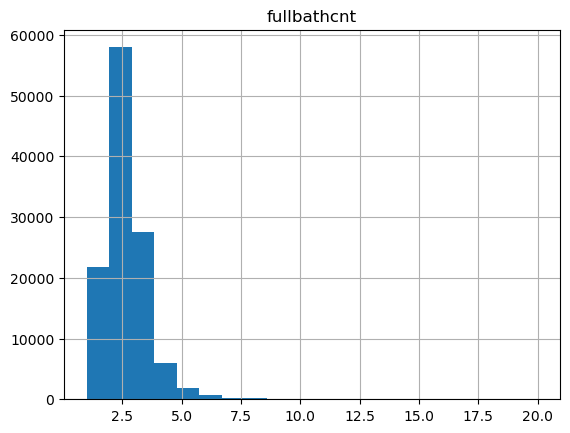

Number of unique values: 15
Unique values: [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 9.0, nan, 7.0, 8.0, 10.0, 11.0, 12.0, 15.0, 20.0]


In [90]:
column='fullbathcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We can drop 'calculatedbathnbr' since there is 'bathroomcnt' with less missing values. 

In [91]:
ZD.drop_column(column='fullbathcnt', printBool=True) 

train_x shape: (117521, 40)
val_x shape: (25184, 40)
test_x shape: (25183, 40)


### yearbuilt (impute)	

Column: yearbuilt
Nonzero count: 117521
Ratio of missing data: 0.006322274316930591
Type: float64


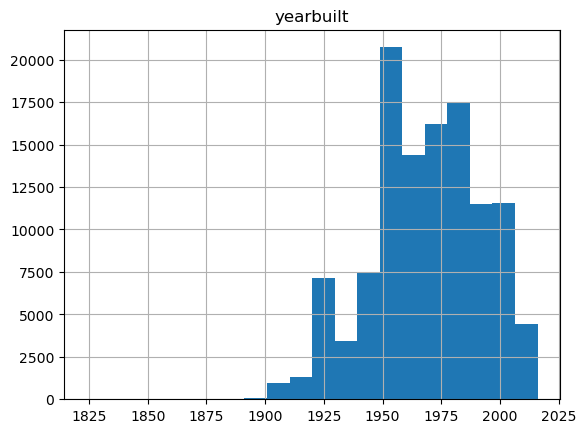

Number of unique values: 136
Unique values: [1912.0, 1913.0, 1917.0, 1923.0, 1924.0, 1926.0, 1927.0, 1929.0, 1930.0, 1933.0, 1937.0, 1938.0, 1939.0, 1940.0, 1941.0, 1942.0, 1943.0, 1946.0, 1947.0, 1948.0, 1950.0, 1951.0, 1952.0, 1953.0, 1955.0, 1956.0, 1957.0, 1958.0, 1960.0, 1961.0, 1962.0, 1963.0, 1965.0, 1967.0, 1968.0, 1969.0, 1970.0, 1971.0, 1972.0, 1973.0, 1974.0, 1975.0, 1976.0, 1977.0, 1978.0, 1979.0, 1980.0, 1981.0, 1982.0, 1983.0, 1985.0, 1986.0, 1987.0, 1988.0, 1990.0, 1992.0, 1993.0, 1994.0, 1996.0, 1999.0, 2000.0, 2001.0, 2002.0, 2005.0, 2007.0, 2008.0, 2009.0, 2012.0, nan, 1824.0, 1866.0, 1882.0, 1883.0, 1885.0, 1887.0, 1888.0, 1889.0, 1890.0, 1891.0, 1892.0, 1893.0, 1894.0, 1895.0, 1896.0, 1897.0, 1898.0, 1899.0, 1900.0, 1901.0, 1902.0, 1903.0, 1904.0, 1905.0, 1906.0, 1907.0, 1908.0, 1909.0, 1910.0, 1911.0, 1914.0, 1915.0, 1916.0, 1918.0, 1919.0, 1920.0, 1921.0, 1922.0, 1925.0, 1928.0, 1931.0, 1932.0, 1934.0, 1935.0, 1936.0, 1944.0, 1945.0, 1949.0, 1954.0, 1959.0, 1964.0

In [92]:
column='yearbuilt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

For 'yearbuilt' we will impute the mode since the distribution is skewed older.

In [93]:
ZD.impute_column(column='yearbuilt', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x yearbuilt unique values: [1824.0, 1866.0, 1882.0, 1883.0, 1885.0, 1887.0, 1888.0, 1889.0, 1890.0, 1891.0, 1892.0, 1893.0, 1894.0, 1895.0, 1896.0, 1897.0, 1898.0, 1899.0, 1900.0, 1901.0, 1902.0, 1903.0, 1904.0, 1905.0, 1906.0, 1907.0, 1908.0, 1909.0, 1910.0, 1911.0, 1912.0, 1913.0, 1914.0, 1915.0, 1916.0, 1917.0, 1918.0, 1919.0, 1920.0, 1921.0, 1922.0, 1923.0, 1924.0, 1925.0, 1926.0, 1927.0, 1928.0, 1929.0, 1930.0, 1931.0, 1932.0, 1933.0, 1934.0, 1935.0, 1936.0, 1937.0, 1938.0, 1939.0, 1940.0, 1941.0, 1942.0, 1943.0, 1944.0, 1945.0, 1946.0, 1947.0, 1948.0, 1949.0, 1950.0, 1951.0, 1952.0, 1953.0, 1954.0, 1955.0, 1956.0, 1957.0, 1958.0, 1959.0, 1960.0, 1961.0, 1962.0, 1963.0, 1964.0, 1965.0, 1966.0, 1967.0, 1968.0, 1969.0, 1970.0, 1971.0, 1972.0, 1973.0, 1974.0, 1975.0, 1976.0, 1977.0, 1978.0, 1979.0, 1980.0, 1981.0, 1982.0, 1983.0, 1984.0, 1985.0, 1986.0, 1987.0, 1988.0, 1989.0, 1990.0, 1991.0, 1992.0, 1993.0, 1994.0, 1995.0, 1996.0, 1997.0, 1998.0, 1999.0, 2000.0, 2001.0, 2002.0

### censustractandblock	(drop)

Column: censustractandblock
Nonzero count: 117521
Ratio of missing data: 0.005292671097080522
Type: float64


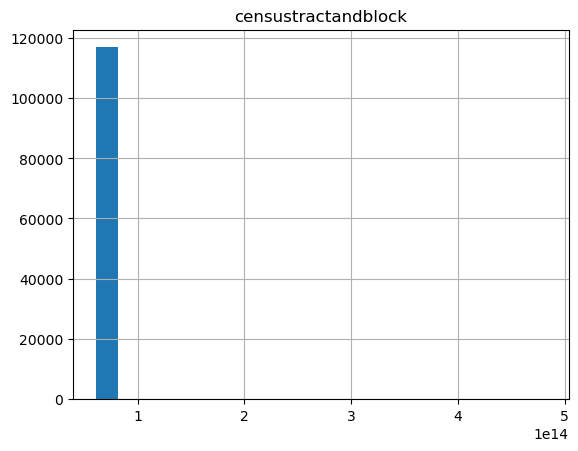

Number of unique values: 48681
Unique values: [60371011101005.0, 60371011101008.0, 60371011101009.0, 60371011101011.0, 60371011102002.0, 60371011102003.0, 60371011102004.0, 60371011102005.0, 60371011102008.0, 60371011103005.0, 60371011221000.0, 60371011221002.0, 60371011221004.0, 60371011221009.0, 60371011221010.0, 60371011222001.0, 60371011222005.0, 60371012101000.0, 60371012101004.0, 60371012102003.0, 60371012102006.0, 60371012102008.0, 60371012201000.0, 60371012201005.0, 60371012201006.0, 60371012201007.0, 60371012202003.0, 60371012202004.0, 60371012202007.0, 60371013001003.0, 60371013001009.0, 60371013001013.0, 60371013002002.0, 60371013002003.0, 60371013002006.0, 60371013002008.0, 60371013003000.0, 60371013003001.0, 60371013003002.0, 60371013003004.0, 60371013004002.0, 60371013004003.0, 60371013004004.0, 60371013004008.0, 60371014002001.0, 60371014002006.0, 60371014003002.0, 60371014003004.0, 60371014003005.0, 60371021031001.0, 60371021031003.0, 60371021041000.0, 60371021041002.0,

In [94]:
column='censustractandblock'
ZillowData.investigate_column(column=column, df=ZD.train_x)

In [95]:
print(f"Unique value count: {len(ZD.train_x[column].unique())}")
print(f"Unique values standard deviation (ignoring NaNs): {np.nanstd(ZD.train_x[column].unique())}")

Unique value count: 48681
Unique values standard deviation (ignoring NaNs): 1925866841856.9587


Although there are very few missing values for 'censustractandblock', there are so many unique values with a large standard deviation so we will drop it.

In [96]:
ZD.drop_column(column='censustractandblock', printBool=True) 

train_x shape: (117521, 39)
val_x shape: (25184, 39)
test_x shape: (25183, 39)


Now for the final columns.

In [97]:
train_na_ratio_df.iloc[40:,:]

,NAN_ratio
censustractandblock,0.005293
structuretaxvaluedollarcnt,0.003302
regionidzip,0.000757
taxamount,0.000323
landtaxvaluedollarcnt,0.000272
taxvaluedollarcnt,0.000264
roomcnt,0.000247
bathroomcnt,0.000247
bedroomcnt,0.000247
assessmentyear,0.000247


### calculatedfinishedsquarefeet (impute)

Column: calculatedfinishedsquarefeet
Nonzero count: 117521
Ratio of missing data: 0.005386271389794165
Type: float64


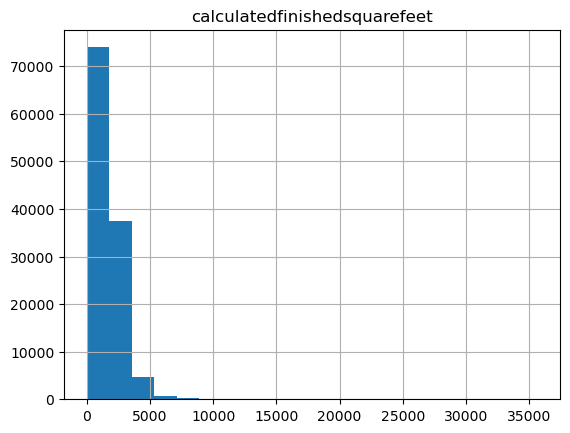

Number of unique values: 5382
Unique values: [120.0, 230.0, 384.0, 603.0, 624.0, 625.0, 675.0, 676.0, 682.0, 689.0, 700.0, 718.0, 720.0, 729.0, 735.0, 738.0, 762.0, 770.0, 772.0, 794.0, 796.0, 800.0, 802.0, 804.0, 806.0, 809.0, 816.0, 818.0, 821.0, 824.0, 832.0, 837.0, 839.0, 841.0, 847.0, 848.0, 849.0, 864.0, 865.0, 866.0, 868.0, 870.0, 872.0, 874.0, 875.0, 876.0, 879.0, 881.0, 889.0, 896.0, 897.0, 898.0, 899.0, 900.0, 902.0, 904.0, 908.0, 909.0, 910.0, 912.0, 913.0, 916.0, 920.0, 926.0, 928.0, 934.0, 936.0, 940.0, 941.0, 942.0, 943.0, 954.0, 956.0, 957.0, 968.0, 969.0, 974.0, 976.0, 978.0, 979.0, 982.0, 985.0, 986.0, 987.0, 988.0, 989.0, 990.0, 993.0, 994.0, 998.0, 999.0, 1000.0, 1005.0, 1007.0, 1008.0, 1013.0, 1020.0, 1021.0, 1024.0, 1027.0, 1028.0, 1030.0, 1032.0, 1036.0, 1038.0, 1040.0, 1042.0, 1043.0, 1044.0, 1048.0, 1050.0, 1052.0, 1056.0, 1057.0, 1058.0, 1064.0, 1065.0, 1066.0, 1070.0, 1072.0, 1075.0, 1078.0, 1080.0, 1082.0, 1084.0, 1089.0, 1090.0, 1091.0, 1092.0, 1093.0, 1094.

In [98]:
column='calculatedfinishedsquarefeet'
ZillowData.investigate_column(column=column, df=ZD.train_x)

For 'calculatedfinishedsquarefeet' we will impute the median value.

In [99]:
ZD.impute_column(column='calculatedfinishedsquarefeet', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x calculatedfinishedsquarefeet unique values: [2.0, 40.0, 66.0, 120.0, 128.0, 152.0, 160.0, 214.0, 230.0, 240.0, 242.0, 257.0, 270.0, 280.0, 288.0, 300.0, 304.0, 310.0, 316.0, 319.0, 320.0, 326.0, 332.0, 342.0, 343.0, 352.0, 358.0, 360.0, 362.0, 363.0, 368.0, 369.0, 370.0, 371.0, 372.0, 377.0, 378.0, 380.0, 381.0, 382.0, 384.0, 385.0, 388.0, 389.0, 393.0, 396.0, 397.0, 398.0, 400.0, 403.0, 404.0, 405.0, 407.0, 408.0, 410.0, 412.0, 415.0, 417.0, 418.0, 419.0, 420.0, 426.0, 427.0, 428.0, 431.0, 432.0, 433.0, 436.0, 438.0, 439.0, 440.0, 441.0, 442.0, 444.0, 445.0, 448.0, 449.0, 454.0, 455.0, 456.0, 457.0, 458.0, 460.0, 462.0, 464.0, 465.0, 466.0, 468.0, 470.0, 471.0, 472.0, 473.0, 474.0, 475.0, 476.0, 477.0, 478.0, 480.0, 481.0, 482.0, 483.0, 484.0, 486.0, 487.0, 488.0, 490.0, 492.0, 494.0, 495.0, 496.0, 497.0, 498.0, 499.0, 500.0, 501.0, 502.0, 504.0, 505.0, 506.0, 508.0, 509.0, 510.0, 511.0, 512.0, 513.0, 514.0, 515.0, 516.0, 518.0, 519.0, 520.0, 521.0, 522.0, 523.0, 524.0, 525.0,

### structuretaxvaluedollarcnt (impute)

Column: structuretaxvaluedollarcnt
Nonzero count: 117521
Ratio of missing data: 0.0033015375975357594
Type: float64


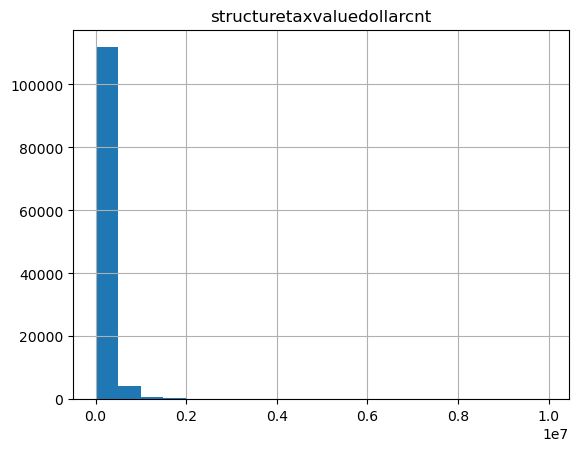

Number of unique values: 73789
Unique values: [44.0, 113.0, 132.0, 146.0, 148.0, 181.0, 1319.0, 1422.0, 2927.0, 4073.0, 4120.0, 4181.0, 4483.0, 4526.0, 5099.0, 5155.0, 5193.0, 5232.0, 5565.0, 5909.0, 6066.0, 6094.0, 6141.0, 6151.0, 6170.0, 6186.0, 6190.0, 6195.0, 6277.0, 6298.0, 6515.0, 6709.0, 6916.0, 7115.0, 7318.0, 7522.0, 7682.0, 7778.0, 7781.0, 8257.0, 8328.0, 8335.0, 8462.0, 8543.0, 8736.0, 8755.0, 8798.0, 8837.0, 8877.0, 8937.0, 8954.0, 9000.0, 9090.0, 9155.0, 9190.0, 9217.0, 9499.0, 9560.0, 9640.0, 9705.0, 9994.0, 10000.0, 10121.0, 10127.0, 10176.0, 10199.0, 10236.0, 10237.0, 10245.0, 10331.0, 10332.0, 10540.0, 10642.0, 10703.0, 10745.0, 10786.0, 10991.0, 11158.0, 11196.0, 11250.0, 11304.0, 11357.0, 11366.0, 11383.0, 11398.0, 11408.0, 11571.0, 11679.0, 11774.0, 11803.0, 11804.0, 11965.0, 12014.0, 12197.0, 12398.0, 12423.0, 12472.0, 12525.0, 12531.0, 12598.0, 12601.0, 12640.0, 12743.0, 12813.0, 12826.0, 12890.0, 12911.0, 13021.0, 13022.0, 13027.0, 13037.0, 13173.0, 13203.0, 1322

In [100]:
column='structuretaxvaluedollarcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the median for 'structuretaxvaluedollarcnt'.

In [101]:
ZD.impute_column(column='structuretaxvaluedollarcnt', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x structuretaxvaluedollarcnt unique values: [44.0, 100.0, 101.0, 104.0, 107.0, 113.0, 118.0, 132.0, 144.0, 146.0, 148.0, 170.0, 181.0, 302.0, 470.0, 516.0, 844.0, 896.0, 1000.0, 1004.0, 1015.0, 1019.0, 1024.0, 1044.0, 1179.0, 1239.0, 1319.0, 1387.0, 1422.0, 1453.0, 1457.0, 1463.0, 1486.0, 1508.0, 1516.0, 1575.0, 1883.0, 2018.0, 2419.0, 2549.0, 2827.0, 2927.0, 3005.0, 3034.0, 3066.0, 3224.0, 3282.0, 3448.0, 3644.0, 3699.0, 3848.0, 3883.0, 3906.0, 3967.0, 4059.0, 4073.0, 4120.0, 4181.0, 4252.0, 4316.0, 4435.0, 4459.0, 4480.0, 4482.0, 4483.0, 4486.0, 4526.0, 4643.0, 4662.0, 4717.0, 4720.0, 4733.0, 4741.0, 4746.0, 4784.0, 4810.0, 4866.0, 4940.0, 4975.0, 5000.0, 5003.0, 5075.0, 5099.0, 5107.0, 5118.0, 5155.0, 5176.0, 5193.0, 5200.0, 5225.0, 5232.0, 5254.0, 5277.0, 5281.0, 5361.0, 5426.0, 5448.0, 5482.0, 5565.0, 5608.0, 5707.0, 5716.0, 5747.0, 5872.0, 5889.0, 5909.0, 5958.0, 5978.0, 5989.0, 6066.0, 6094.0, 6141.0, 6151.0, 6170.0, 6186.0, 6190.0, 6195.0, 6200.0, 6234.0, 6244.0, 6250.0, 

### regionidzip	(impute)

Column: regionidzip
Nonzero count: 117521
Ratio of missing data: 0.0007573114592285634
Type: float64


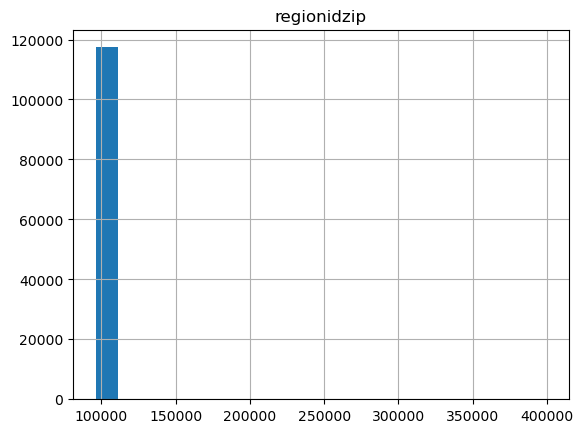

Number of unique values: 391
Unique values: [95982.0, 95983.0, 95984.0, 95985.0, 95986.0, 95987.0, 95988.0, 95989.0, 95991.0, 95992.0, 95993.0, 95994.0, 95995.0, 95996.0, 95997.0, 95998.0, 95999.0, 96000.0, 96001.0, 96002.0, 96003.0, 96004.0, 96005.0, 96006.0, 96007.0, 96008.0, 96009.0, 96010.0, 96012.0, 96013.0, 96014.0, 96015.0, 96016.0, 96017.0, 96018.0, 96019.0, 96020.0, 96021.0, 96022.0, 96023.0, 96024.0, 96025.0, 96026.0, 96027.0, 96028.0, 96029.0, 96030.0, 96034.0, 96037.0, 96038.0, 96039.0, 96040.0, 96042.0, 96043.0, 96044.0, 96045.0, 96046.0, 96047.0, 96048.0, 96049.0, 96050.0, 96058.0, 96072.0, 96083.0, 96086.0, 96087.0, 96088.0, 96090.0, 96091.0, 96092.0, 96095.0, 96097.0, 96100.0, 96101.0, 96102.0, 96103.0, 96104.0, 96105.0, 96106.0, 96107.0, 96109.0, 96110.0, 96111.0, 96113.0, 96116.0, 96117.0, 96119.0, 96120.0, 96121.0, 96122.0, 96123.0, 96124.0, 96125.0, 96126.0, 96127.0, 96128.0, 96129.0, 96133.0, 96134.0, 96135.0, 96136.0, 96137.0, 96148.0, 96149.0, 96150.0, 96151.0, 9

In [102]:
column='regionidzip'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the mode for 'regionidzip'.

In [103]:
ZD.impute_column(column='regionidzip', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x regionidzip unique values: [95982.0, 95983.0, 95984.0, 95985.0, 95986.0, 95987.0, 95988.0, 95989.0, 95991.0, 95992.0, 95993.0, 95994.0, 95995.0, 95996.0, 95997.0, 95998.0, 95999.0, 96000.0, 96001.0, 96002.0, 96003.0, 96004.0, 96005.0, 96006.0, 96007.0, 96008.0, 96009.0, 96010.0, 96012.0, 96013.0, 96014.0, 96015.0, 96016.0, 96017.0, 96018.0, 96019.0, 96020.0, 96021.0, 96022.0, 96023.0, 96024.0, 96025.0, 96026.0, 96027.0, 96028.0, 96029.0, 96030.0, 96034.0, 96037.0, 96038.0, 96039.0, 96040.0, 96042.0, 96043.0, 96044.0, 96045.0, 96046.0, 96047.0, 96048.0, 96049.0, 96050.0, 96058.0, 96072.0, 96083.0, 96086.0, 96087.0, 96088.0, 96090.0, 96091.0, 96092.0, 96095.0, 96097.0, 96100.0, 96101.0, 96102.0, 96103.0, 96104.0, 96105.0, 96106.0, 96107.0, 96109.0, 96110.0, 96111.0, 96113.0, 96116.0, 96117.0, 96119.0, 96120.0, 96121.0, 96122.0, 96123.0, 96124.0, 96125.0, 96126.0, 96127.0, 96128.0, 96129.0, 96133.0, 96134.0, 96135.0, 96136.0, 96137.0, 96148.0, 96149.0, 96150.0, 96151.0, 96152.0, 9

### taxamount (impute)

Column: taxamount
Nonzero count: 117521
Ratio of missing data: 0.0003233464657380383
Type: float64


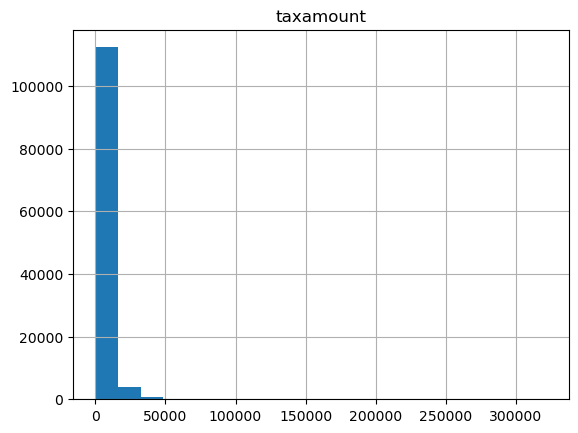

Number of unique values: 108346
Unique values: [49.18, 51.26, 51.4, 64.0, 107.9, 126.72, 165.84, 184.66, 221.0, 233.88, 236.46, 244.11, 268.56, 269.75, 273.09, 273.44, 276.08, 284.46, 292.19, 299.31, 301.82, 305.94, 317.02, 332.4, 333.75, 334.38, 335.57, 337.17, 340.14, 343.43, 345.72, 349.99, 350.06, 350.65, 351.18, 353.56, 357.77, 359.62, 359.98, 360.62, 365.09, 375.34, 375.68, 377.56, 380.1, 380.32, 384.67, 388.18, 389.7, 392.71, 397.56, 397.86, 399.69, 403.38, 405.44, 406.92, 408.16, 409.43, 409.82, 410.72, 412.07, 412.15, 412.23, 414.59, 418.15, 418.75, 419.86, 420.29, 422.5, 424.33, 425.97, 430.9, 430.94, 432.37, 432.76, 432.82, 439.12, 440.45, 440.47, 440.58, 441.25, 442.35, 442.98, 443.32, 444.82, 446.7, 454.76, 454.98, 456.42, 460.15, 461.3, 464.38, 466.64, 467.65, 468.22, 469.9, 470.49, 470.65, 471.88, 474.84, 476.2, 476.49, 482.97, 483.02, 483.42, 484.23, 486.0, 487.1, 488.85, 489.06, 490.31, 490.49, 490.68, 491.29, 493.05, 494.49, 494.82, 494.98, 496.15, 496.93, 499.17, 500

In [104]:
column='taxamount'
ZillowData.investigate_column(column=column, df=ZD.train_x)

For 'taxamount' we will impute the median.

In [105]:
ZD.impute_column(column='taxamount', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x taxamount unique values: [49.18, 51.26, 51.4, 61.82, 62.44, 64.0, 85.0, 85.94, 85.96, 96.78, 102.02, 106.32, 107.9, 120.84, 126.72, 138.54, 139.59, 142.98, 150.06, 150.58, 150.87, 158.7, 165.84, 181.22, 184.66, 189.08, 193.4, 196.08, 207.2, 212.22, 221.0, 226.3, 233.33, 233.88, 236.46, 236.86, 240.81, 240.9, 242.17, 243.62, 243.96, 244.11, 244.63, 252.32, 254.56, 259.02, 264.33, 268.56, 269.75, 273.09, 273.44, 276.08, 276.79, 277.2, 278.67, 282.4, 284.46, 287.17, 289.32, 292.19, 295.06, 295.88, 299.31, 301.82, 302.94, 303.48, 305.94, 308.31, 309.29, 312.3, 312.96, 315.56, 317.02, 318.0, 318.98, 319.99, 322.52, 329.89, 332.27, 332.4, 332.52, 333.75, 334.38, 335.57, 337.17, 339.9, 340.14, 340.23, 342.4, 343.21, 343.43, 343.52, 344.18, 345.7, 345.72, 346.85, 347.06, 347.24, 348.89, 349.99, 350.06, 350.65, 350.92, 351.06, 351.18, 353.56, 355.74, 357.77, 359.62, 359.98, 360.01, 360.62, 361.95, 362.97, 365.09, 367.38, 369.43, 369.99, 371.08, 371.54, 372.95, 375.3, 375.34, 375.68, 375

### taxvaluedollarcnt (impute)

Column: taxvaluedollarcnt
Nonzero count: 117521
Ratio of missing data: 0.0002637826431020839
Type: float64


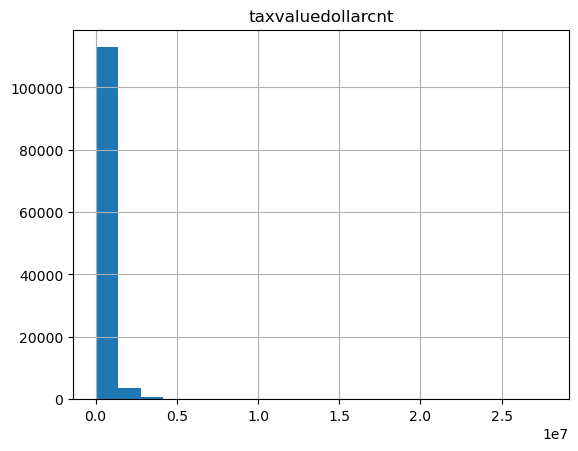

Number of unique values: 76572
Unique values: [22.0, 1044.0, 1928.0, 9242.0, 9271.0, 10000.0, 10504.0, 10631.0, 10888.0, 10899.0, 10952.0, 13198.0, 13817.0, 14186.0, 14634.0, 14636.0, 15162.0, 15369.0, 15433.0, 15476.0, 15870.0, 16073.0, 16272.0, 16473.0, 16520.0, 17716.0, 17761.0, 17900.0, 17991.0, 18098.0, 18359.0, 18510.0, 18919.0, 18998.0, 19120.0, 19207.0, 19476.0, 19524.0, 19528.0, 19536.0, 19929.0, 19938.0, 19964.0, 20452.0, 20664.0, 20863.0, 20865.0, 21074.0, 21162.0, 21280.0, 21283.0, 21370.0, 21690.0, 21897.0, 21945.0, 22111.0, 22181.0, 22385.0, 22393.0, 22620.0, 22790.0, 22934.0, 22990.0, 23002.0, 23201.0, 23350.0, 23353.0, 23409.0, 23556.0, 23615.0, 23817.0, 23818.0, 23978.0, 24178.0, 24179.0, 24218.0, 24223.0, 24227.0, 24380.0, 24428.0, 24589.0, 24591.0, 24629.0, 24632.0, 24634.0, 24636.0, 24799.0, 25040.0, 25044.0, 25218.0, 25242.0, 25280.0, 25649.0, 25801.0, 25832.0, 25835.0, 25863.0, 25864.0, 26243.0, 26246.0, 26413.0, 26453.0, 26870.0, 26877.0, 27085.0, 27086.0, 27491.

In [106]:
column='taxvaluedollarcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

we will impute the median for 'taxvaluedollarcnt'.

In [107]:
ZD.impute_column(column='taxvaluedollarcnt', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x taxvaluedollarcnt unique values: [22.0, 1044.0, 1928.0, 2675.0, 3254.0, 7771.0, 8314.0, 9242.0, 9271.0, 9969.0, 10000.0, 10504.0, 10631.0, 10888.0, 10899.0, 10952.0, 11077.0, 11089.0, 11122.0, 11683.0, 11981.0, 12184.0, 12192.0, 12596.0, 12598.0, 12998.0, 13000.0, 13198.0, 13199.0, 13209.0, 13282.0, 13524.0, 13817.0, 13820.0, 13880.0, 14025.0, 14071.0, 14186.0, 14226.0, 14231.0, 14284.0, 14439.0, 14443.0, 14577.0, 14629.0, 14634.0, 14636.0, 14687.0, 14811.0, 15043.0, 15162.0, 15369.0, 15433.0, 15476.0, 15692.0, 15870.0, 15890.0, 16057.0, 16062.0, 16073.0, 16084.0, 16097.0, 16108.0, 16272.0, 16317.0, 16364.0, 16473.0, 16475.0, 16476.0, 16477.0, 16514.0, 16520.0, 16714.0, 16722.0, 16723.0, 16873.0, 16939.0, 17032.0, 17079.0, 17086.0, 17343.0, 17417.0, 17546.0, 17652.0, 17691.0, 17693.0, 17716.0, 17761.0, 17896.0, 17900.0, 17991.0, 18098.0, 18359.0, 18431.0, 18510.0, 18514.0, 18589.0, 18713.0, 18714.0, 18787.0, 18919.0, 18998.0, 19120.0, 19131.0, 19184.0, 19203.0, 19207.0, 19208.0

### landtaxvaluedollarcnt (impute)

Column: landtaxvaluedollarcnt
Nonzero count: 117521
Ratio of missing data: 0.00027229176062150596
Type: float64


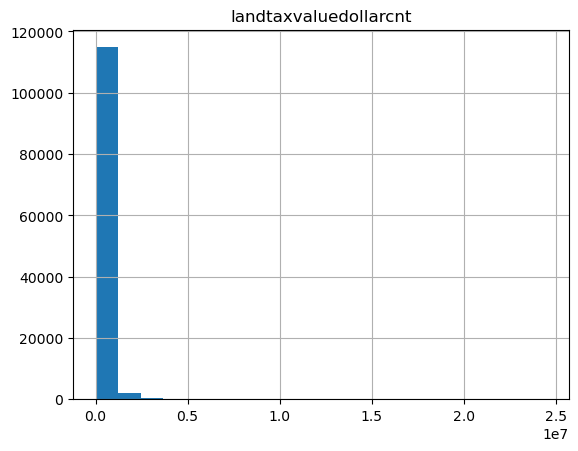

Number of unique values: 76797
Unique values: [22.0, 278.0, 940.0, 1600.0, 2237.0, 2784.0, 2800.0, 3448.0, 3682.0, 3901.0, 3906.0, 4064.0, 4103.0, 4116.0, 4252.0, 4459.0, 4866.0, 4875.0, 4877.0, 5152.0, 5361.0, 5680.0, 5733.0, 5774.0, 5819.0, 6052.0, 6084.0, 6143.0, 6171.0, 6176.0, 6186.0, 6262.0, 6269.0, 6298.0, 6371.0, 6394.0, 6499.0, 6583.0, 6629.0, 6761.0, 6789.0, 6880.0, 6916.0, 6965.0, 7021.0, 7115.0, 7200.0, 7516.0, 7532.0, 7544.0, 7636.0, 7705.0, 7711.0, 8048.0, 8094.0, 8133.0, 8231.0, 8257.0, 8273.0, 8335.0, 8462.0, 8479.0, 8527.0, 8538.0, 8572.0, 8591.0, 8699.0, 8717.0, 8745.0, 8748.0, 8788.0, 8877.0, 8941.0, 8944.0, 9009.0, 9090.0, 9097.0, 9109.0, 9124.0, 9150.0, 9155.0, 9158.0, 9366.0, 9371.0, 9472.0, 9513.0, 9539.0, 9592.0, 9663.0, 9705.0, 9747.0, 9763.0, 9766.0, 9900.0, 9938.0, 9979.0, 10000.0, 10093.0, 10176.0, 10245.0, 10313.0, 10331.0, 10378.0, 10382.0, 10609.0, 10631.0, 10659.0, 10722.0, 10745.0, 10775.0, 10833.0, 10876.0, 10897.0, 10899.0, 10900.0, 10906.0, 10934.0, 

In [108]:
column='landtaxvaluedollarcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the median for 'landtaxvaluedollarcnt'.

In [109]:
ZD.impute_column(column='landtaxvaluedollarcnt', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x landtaxvaluedollarcnt unique values: [22.0, 278.0, 370.0, 940.0, 1319.0, 1327.0, 1393.0, 1479.0, 1576.0, 1600.0, 1627.0, 1928.0, 1998.0, 2178.0, 2200.0, 2217.0, 2237.0, 2250.0, 2627.0, 2675.0, 2686.0, 2784.0, 2800.0, 3080.0, 3134.0, 3448.0, 3480.0, 3682.0, 3700.0, 3901.0, 3906.0, 3953.0, 4059.0, 4064.0, 4103.0, 4116.0, 4242.0, 4252.0, 4459.0, 4526.0, 4662.0, 4733.0, 4747.0, 4866.0, 4875.0, 4877.0, 4912.0, 4940.0, 4981.0, 4983.0, 5075.0, 5152.0, 5225.0, 5281.0, 5305.0, 5310.0, 5361.0, 5367.0, 5381.0, 5454.0, 5482.0, 5538.0, 5572.0, 5680.0, 5705.0, 5733.0, 5774.0, 5819.0, 5830.0, 5863.0, 5978.0, 6012.0, 6052.0, 6079.0, 6084.0, 6143.0, 6171.0, 6176.0, 6186.0, 6262.0, 6269.0, 6298.0, 6371.0, 6386.0, 6394.0, 6414.0, 6426.0, 6499.0, 6583.0, 6629.0, 6632.0, 6640.0, 6654.0, 6709.0, 6753.0, 6761.0, 6789.0, 6811.0, 6880.0, 6893.0, 6915.0, 6916.0, 6955.0, 6965.0, 6974.0, 6977.0, 7013.0, 7021.0, 7025.0, 7108.0, 7115.0, 7200.0, 7315.0, 7318.0, 7320.0, 7335.0, 7413.0, 7419.0, 7426.0, 7429.0,

### rawcensustractandblock (drop)

Column: rawcensustractandblock
Nonzero count: 117521
Ratio of missing data: 0.0002467644080632398
Type: float64


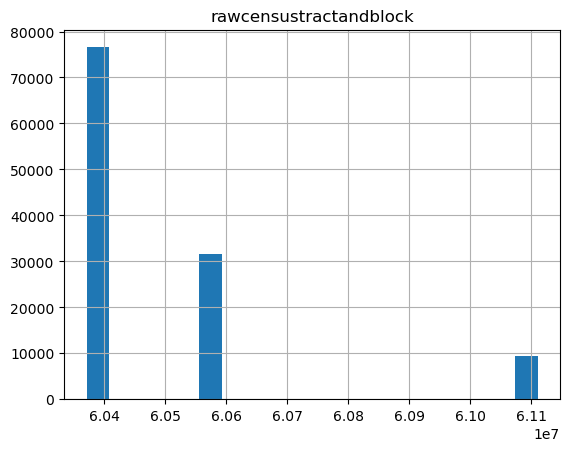

Number of unique values: 48935
Unique values: [60371011.101, 60371011.101005, 60371011.101008, 60371011.101009, 60371011.101011, 60371011.102002, 60371011.102003, 60371011.102004, 60371011.102005, 60371011.102008, 60371011.103005, 60371011.221, 60371011.221002, 60371011.221004, 60371011.221009, 60371011.22101, 60371011.222001, 60371011.222005, 60371012.101, 60371012.101004, 60371012.102003, 60371012.102006, 60371012.102008, 60371012.201, 60371012.201005, 60371012.201007, 60371012.202003, 60371012.202004, 60371012.202007, 60371013.001003, 60371013.001009, 60371013.001013, 60371013.002002, 60371013.002003, 60371013.002006, 60371013.002008, 60371013.003, 60371013.003001, 60371013.003002, 60371013.003004, 60371013.004002, 60371013.004003, 60371013.004004, 60371013.004008, 60371014.002006, 60371014.003002, 60371014.003004, 60371014.003005, 60371021.031001, 60371021.031003, 60371021.041, 60371021.041002, 60371021.04101, 60371021.041018, 60371021.04102, 60371021.041025, 60371021.042, 60371021

In [110]:
column='rawcensustractandblock'
ZillowData.investigate_column(column=column, df=ZD.train_x)

In [111]:
print(f"Unique value count: {len(ZD.train_x[column].unique())}")
print(f"Unique values standard deviation (ignoring NaNs): {np.nanstd(ZD.train_x[column].unique())}")

Unique value count: 48935
Unique values standard deviation (ignoring NaNs): 202873.53875222986


Although there are few missing values from 'rawcensustractandblock', there are many unique values and a huge standard deviation so we will drop it.

In [112]:
ZD.drop_column(column='rawcensustractandblock', printBool=True) 

train_x shape: (117521, 38)
val_x shape: (25184, 38)
test_x shape: (25183, 38)


### propertylandusetypeid (impute)

Column: propertylandusetypeid
Nonzero count: 117521
Ratio of missing data: 0.0002467644080632398
Type: float64


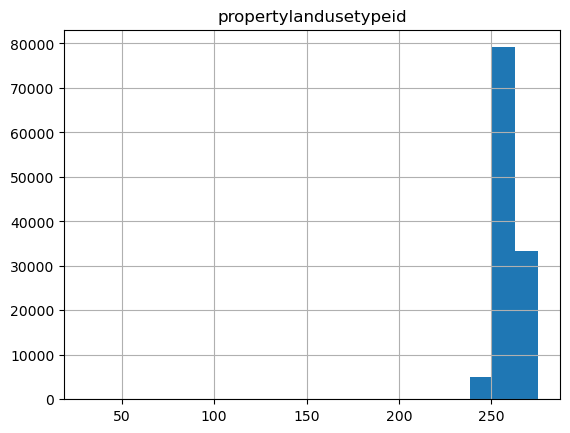

Number of unique values: 15
Unique values: [31.0, 47.0, 246.0, 247.0, 248.0, 260.0, 261.0, 263.0, 265.0, 266.0, 269.0, nan, 264.0, 267.0, 275.0]


In [113]:
column='propertylandusetypeid'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the mode for 'propertylandusetypeid'.

In [114]:
ZD.impute_column(column='propertylandusetypeid', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x propertylandusetypeid unique values: [31.0, 47.0, 246.0, 247.0, 248.0, 260.0, 261.0, 263.0, 264.0, 265.0, 266.0, 267.0, 269.0, 275.0]


### fips (impute)

Column: fips
Nonzero count: 117521
Ratio of missing data: 0.0002467644080632398
Type: float64


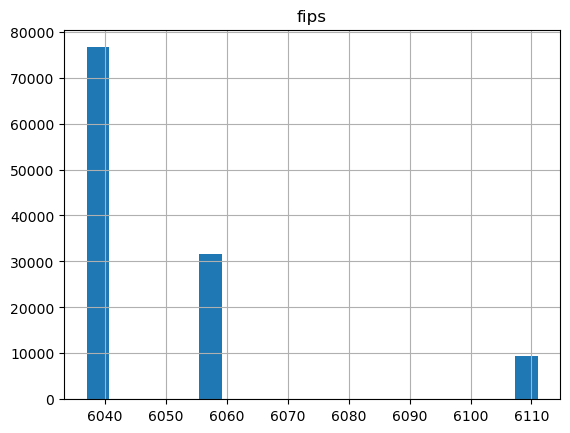

Number of unique values: 4
Unique values: [6037.0, 6059.0, 6111.0, nan]


In [115]:
column='fips'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the mode for 'fips'.

In [116]:
ZD.impute_column(column='fips', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x fips unique values: [6037.0, 6059.0, 6111.0]


### longitude (impute)	

Column: longitude
Nonzero count: 117521
Ratio of missing data: 0.0002467644080632398
Type: float64


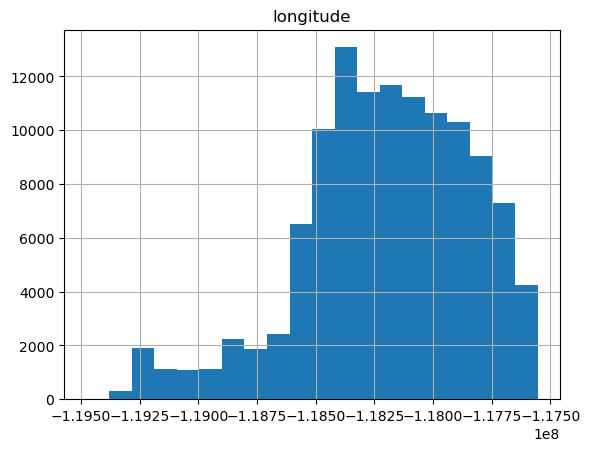

Number of unique values: 91211
Unique values: [-119475416.0, -119475265.0, -119447865.0, -119447353.0, -119445901.0, -119414285.0, -119387480.0, -119382958.0, -119371742.0, -119315009.0, -119312477.0, -119312404.0, -119311000.0, -119310294.0, -119307974.0, -119305205.0, -119304940.0, -119304882.0, -119304849.0, -119303785.0, -119303490.0, -119303102.0, -119303077.0, -119302558.0, -119302495.0, -119302364.0, -119302355.0, -119302170.0, -119302081.0, -119302002.0, -119301586.0, -119301365.0, -119300998.0, -119300832.0, -119300677.0, -119300446.0, -119300136.0, -119300008.0, -119300000.0, -119299987.0, -119299063.0, -119297890.0, -119297828.0, -119297383.0, -119297240.0, -119297170.0, -119296967.0, -119296911.0, -119296387.0, -119296324.0, -119296311.0, -119296197.0, -119295984.0, -119295698.0, -119295368.0, -119295252.0, -119295175.0, -119295050.0, -119295000.0, -119294246.0, -119294149.0, -119294131.0, -119294094.0, -119294000.0, -119293965.0, -119293767.0, -119293659.0, -119293615.0, -

In [117]:
column='longitude'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the median for 'longitude'.

In [118]:
ZD.impute_column(column='longitude', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x longitude unique values: [-119475416.0, -119475265.0, -119447944.0, -119447865.0, -119447353.0, -119447010.0, -119446093.0, -119445901.0, -119437361.0, -119414285.0, -119387480.0, -119382958.0, -119382197.0, -119371742.0, -119362718.0, -119355215.0, -119355052.0, -119315009.0, -119313790.0, -119312477.0, -119312404.0, -119312167.0, -119311166.0, -119311000.0, -119310527.0, -119310447.0, -119310294.0, -119309813.0, -119309298.0, -119308461.0, -119308245.0, -119307974.0, -119306147.0, -119306117.0, -119305943.0, -119305658.0, -119305205.0, -119305032.0, -119304940.0, -119304882.0, -119304849.0, -119304774.0, -119303944.0, -119303785.0, -119303757.0, -119303745.0, -119303567.0, -119303490.0, -119303286.0, -119303181.0, -119303102.0, -119303079.0, -119303077.0, -119303019.0, -119302952.0, -119302658.0, -119302641.0, -119302558.0, -119302495.0, -119302364.0, -119302355.0, -119302182.0, -119302170.0, -119302156.0, -119302151.0, -119302081.0, -119302002.0, -119301842.0, -119301824.0, 

### roomcnt	(drop)

Column: roomcnt
Nonzero count: 26650
Ratio of missing data: 0.0002467644080632398
Type: float64


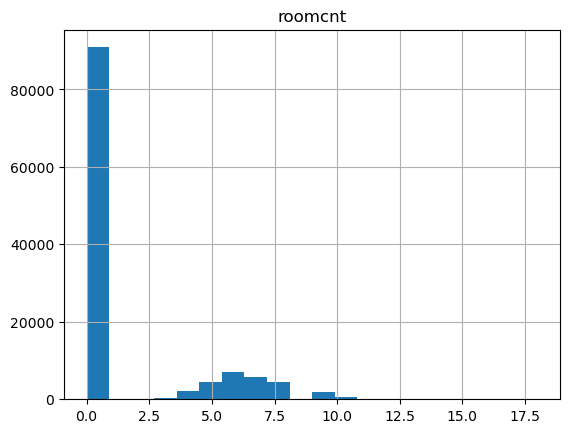

Number of unique values: 18
Unique values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, nan, 13.0, 14.0, 15.0, 18.0]


In [119]:
column='roomcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

In [120]:
print(f'roomcnt number of zeros entered: {(ZD.train_x[column] == 0).sum()}')

roomcnt number of zeros entered: 90871


There appears to be something wrong with this column as a majority of the training examples enter zero rooms so we will drop 'roomcnt'.

In [121]:
ZD.drop_column(column='roomcnt', printBool=True) 

train_x shape: (117521, 37)
val_x shape: (25184, 37)
test_x shape: (25183, 37)


### latitude (impute)	

Column: latitude
Nonzero count: 117521
Ratio of missing data: 0.0002467644080632398
Type: float64


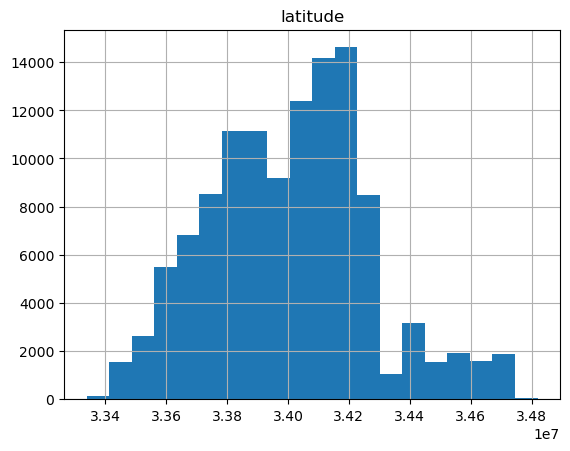

Number of unique values: 92403
Unique values: [33339527.0, 33339600.0, 33339830.0, 33340045.0, 33340658.0, 33340937.0, 33341018.0, 33341300.0, 33342362.0, 33344167.0, 33344200.0, 33344252.0, 33345375.0, 33346224.0, 33354200.0, 33354386.0, 33394897.0, 33396596.0, 33397040.0, 33397635.0, 33399328.0, 33399642.0, 33400155.0, 33400364.0, 33403574.0, 33404682.0, 33404870.0, 33404980.0, 33406400.0, 33406500.0, 33406698.0, 33406700.0, 33407007.0, 33407400.0, 33407968.0, 33408179.0, 33408337.0, 33408442.0, 33408898.0, 33409000.0, 33409415.0, 33409641.0, 33409931.0, 33410522.0, 33410550.0, 33410684.0, 33410862.0, 33411201.0, 33411701.0, 33411884.0, 33411990.0, 33411996.0, 33412101.0, 33412140.0, 33412213.0, 33412325.0, 33412747.0, 33412900.0, 33413025.0, 33413672.0, 33413799.0, 33413828.0, 33413922.0, 33414556.0, 33414785.0, 33414980.0, 33415205.0, 33415403.0, 33415558.0, 33415977.0, 33416112.0, 33416213.0, 33416534.0, 33417454.0, 33417638.0, 33417686.0, 33417743.0, 33417821.0, 33418044.0, 33418

In [122]:
column='latitude'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the median for 'latitude'.

In [123]:
ZD.impute_column(column='latitude', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x latitude unique values: [33339527.0, 33339600.0, 33339830.0, 33340045.0, 33340134.0, 33340239.0, 33340508.0, 33340620.0, 33340658.0, 33340851.0, 33340937.0, 33341018.0, 33341282.0, 33341300.0, 33341351.0, 33341389.0, 33341610.0, 33341653.0, 33341879.0, 33342362.0, 33343400.0, 33344167.0, 33344200.0, 33344252.0, 33344483.0, 33345375.0, 33346224.0, 33354200.0, 33354341.0, 33354386.0, 33354509.0, 33354636.0, 33354681.0, 33393644.0, 33394182.0, 33394897.0, 33396596.0, 33397040.0, 33397138.0, 33397635.0, 33398614.0, 33399328.0, 33399500.0, 33399642.0, 33400155.0, 33400364.0, 33400699.0, 33402263.0, 33402794.0, 33403574.0, 33404682.0, 33404870.0, 33404980.0, 33406400.0, 33406500.0, 33406698.0, 33406700.0, 33407007.0, 33407239.0, 33407400.0, 33407597.0, 33407968.0, 33408179.0, 33408200.0, 33408215.0, 33408337.0, 33408362.0, 33408434.0, 33408442.0, 33408504.0, 33408898.0, 33409000.0, 33409415.0, 33409641.0, 33409931.0, 33410192.0, 33410522.0, 33410550.0, 33410684.0, 33410862.0, 3341120

### regionidcounty (impute)

Column: regionidcounty
Nonzero count: 117521
Ratio of missing data: 0.0002467644080632398
Type: float64


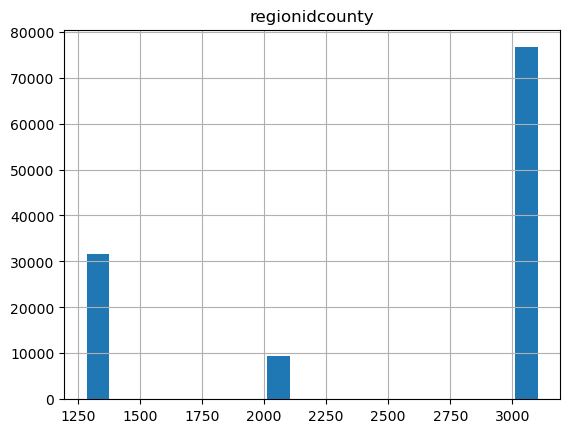

Number of unique values: 4
Unique values: [1286.0, 2061.0, 3101.0, nan]


In [124]:
column='regionidcounty'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the mode for 'regionidcounty'.

In [125]:
ZD.impute_column(column='regionidcounty', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x regionidcounty unique values: [1286.0, 2061.0, 3101.0]


### assessmentyear (impute)

Column: assessmentyear
Nonzero count: 117521
Ratio of missing data: 0.0002467644080632398
Type: float64


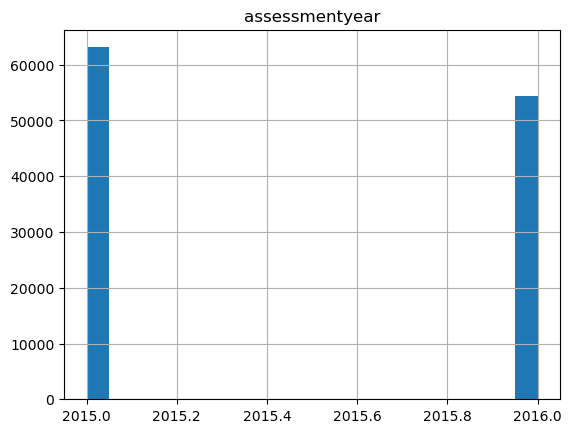

Number of unique values: 3
Unique values: [2015.0, 2016.0, nan]


In [126]:
column='assessmentyear'
ZillowData.investigate_column(column=column, df=ZD.train_x)

In [127]:
print(f'roomcnt number of 2015 entered: {(ZD.train_x[column] == 2015).sum()}')
print(f'roomcnt number of 2016 entered: {(ZD.train_x[column] == 2016).sum()}')

roomcnt number of 2015 entered: 63110
roomcnt number of 2016 entered: 54382


Interestingly 'assessmentyear' is almost evenly split. We will impute the mode.

In [128]:
ZD.impute_column(column='assessmentyear', fill_value=ZD.train_x[column].mode().item(), printBool=True) 

train_x assessmentyear unique values: [2015.0, 2016.0]


### bedroomcnt (impute)

Column: bedroomcnt
Nonzero count: 115937
Ratio of missing data: 0.0002467644080632398
Type: float64


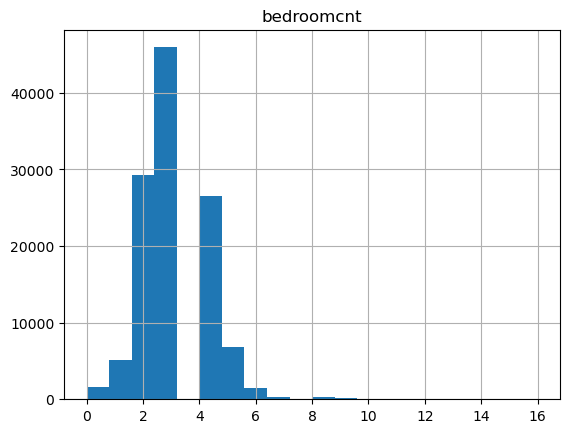

Number of unique values: 18
Unique values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 12.0, nan, 11.0, 13.0, 14.0, 15.0, 16.0]


In [129]:
column='bedroomcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the median for 'bedroomcnt'.

In [130]:
ZD.impute_column(column='bedroomcnt', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x bedroomcnt unique values: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0]


### bathroomcnt	(impute)

Column: bathroomcnt
Nonzero count: 116286
Ratio of missing data: 0.0002467644080632398
Type: float64


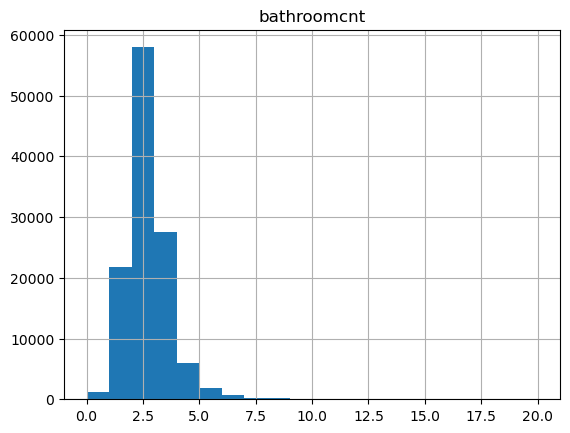

Number of unique values: 24
Unique values: [0.0, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, nan, 10.0, 11.0, 12.0, 15.0, 20.0]


In [131]:
column='bathroomcnt'
ZillowData.investigate_column(column=column, df=ZD.train_x)

We will impute the median for 'bathroomcnt'.

In [132]:
ZD.impute_column(column='bathroomcnt', fill_value=ZD.train_x[column].median(), printBool=True) 

train_x bathroomcnt unique values: [0.0, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 10.0, 11.0, 12.0, 15.0, 20.0]


### propertycountylandusecode (drop)

In [133]:
column='propertycountylandusecode'
#ZillowData.investigate_column(column=column, df=ZD.train_x)
print(f"Unique values: {ZD.train_x[column].unique()}")

Unique values: ['1110' '0200' '01HC' '010E' '0100' '34' '010C' '1' '122' '1111' '0104'
 '0101' '0400' '1129' '010D' '1128' '010V' '38' '01DC' '0300' '012C'
 '0700' '1210' '0109' '0103' '96' '1222' '0108' '010H' nan '070D' '135'
 '1117' '0401' '0201' '010G' '010F' '1116' '01HE' '010M' '1421' '1012'
 '0114' '1310' '1014' '105' '0113' '0210' '73' '0203' '0133' '1200' '1112'
 '0105' '020M' '100V' '012D' '0102' '1321' '1720' '1410' '040V' '1333'
 '012E' '020G' '0141' '0110' '1011' '0131' '0301' '1120' '020E' '01DD'
 '1432' '010' '0' '030G' '0115' '0111' '0130' '010L' '200' '040B' '1722']


We will drop 'propertycountylandusecode' since 'propertylandusetypeid' already provides the same kind of informaiton.

In [134]:
ZD.drop_column(column='propertycountylandusecode', printBool=True) 

train_x shape: (117521, 36)
val_x shape: (25184, 36)
test_x shape: (25183, 36)


We drop the 'parcelid'.

In [135]:
ZD.drop_column(column="parcelid")

Now we will handle date information.

We will create seperate feature columns for:
 - day
 - month
 - year
 - age as of 2016

In [136]:
# train x
datetime_obj = pd.to_datetime(ZD.train_x["transactiondate"]).dt
ZD.train_x["day"] = datetime_obj.day
ZD.train_x["year"] = (datetime_obj.year).astype("category")
ZD.train_x["month"] = (
    (datetime_obj.year - 2016) * 12 + datetime_obj.month
).astype("category")
ZD.drop_column(column="transactiondate")

ZD.train_x["age_from_2016"] = 2016.0 - ZD.train_x["yearbuilt"]
ZD.drop_column(column="yearbuilt")

Lets check the shape of the train set now

In [137]:
print(f'Train X shapes:      {ZD.train_x.shape}, Y shapes: {ZD.train_y.shape}')

Train X shapes:      (117521, 37), Y shapes: (117521, 1)


Ensure all columns are of type float32.

In [138]:
ZD.train_x = ZD.train_x.astype(np.float32)

In [139]:
ZD.train_x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117521 entries, 81426 to 13739
Data columns (total 37 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   airconditioningtypeid         117521 non-null  float32
 1   bathroomcnt                   117521 non-null  float32
 2   bedroomcnt                    117521 non-null  float32
 3   buildingqualitytypeid         117521 non-null  float32
 4   decktypeid                    117521 non-null  float32
 5   calculatedfinishedsquarefeet  117521 non-null  float32
 6   finishedsquarefeet12          117521 non-null  float32
 7   fips                          117521 non-null  float32
 8   fireplacecnt                  117521 non-null  float32
 9   garagecarcnt                  117521 non-null  float32
 10  garagetotalsqft               117521 non-null  float32
 11  hashottuborspa                117521 non-null  float32
 12  heatingorsystemtypeid         117521 non-